In [1]:
import matplotlib.pyplot as plt

import torch
from torchsummary import summary

import numpy as np
import sys, argparse, os

import sys
sys.path.insert(0, '../')
sys.path.append("/scratch2/flood_sim2/mlflood/")
from pathlib import Path
from mlflood.conf import PATH_DATA
from mlflood.conf import rain_const, waterdepth_diff_const

import torch.nn.functional as F

from mlflood.utils import new_log
from models.utae import UTAE
from models.CNNrolling import CNNrolling
from models.unet3d import UNet3D
from models.unet import UNet
from models.unet_bay import UNet_bay

# from dataloading.dataset_max_multi import load_test_dataset
# from dataloading.dataset_max_multi import dataloader_args_test

# from dataloading.dataset_max_709_stef import load_test_dataset
# from dataloading.dataset_max_709_stef import dataloader_args_test

from dataloading.dataset_max_709 import load_test_dataset
from dataloading.dataset_max_709 import dataloader_args_test

from training import *

3.4.0
3.4.0
3.4.0
3.4.0
3.4.0


In [2]:
#path_exp = "/scratch2/ml_flood/data/checkpoints/709/cluster/unet_l1/experiment_0/"
path_exp = "/scratch2/flood_sim2/data/checkpoints/multi/cluster/unet_bay_mask/experiment_0/"
path_exp = "/scratch2/ml_flood/data/checkpoints/709/unet_no_bay/experiment_13/"

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Using: ', device)
args = []   

Using:  cuda


In [4]:
## For Stefania
import yaml 
parser = argparse.ArgumentParser(description="evaluation")
parser.add_argument("--catchment_kwargs", default='./default_catchment_kwargs.yml', type=str, 
                    help="path to catchment kwargs saved in yml file")

exp_hp = ['--catchment_kwargs=../mlflood/exp_yml/exp_unet_no_bay_10.yml']
args = parser.parse_args(exp_hp)

with open(args.catchment_kwargs) as file:
    catchment_kwargs = yaml.full_load(file)
    
# Always in eval mode
catchment_kwargs['fix_indexes'] = True 
catchment_kwargs['use_diff_dem'] = True

In [5]:
parser = argparse.ArgumentParser(description="evaluation")
parser.add_argument("--task", default='max_depth', type=str, 
                    help="task to run")

exp_hp = ['--task=max_depth']
args = parser.parse_args(exp_hp)


In [6]:
# ## For Priyanka

# ### Catchment settings
# catchment_kwargs = {}
# catchment_kwargs["num"] = "709_max"
# catchment_kwargs["tau"] = 0.5
# catchment_kwargs["timestep"]= 1     # for timestep >1 use CNN rolling or Unet
# catchment_kwargs["sample_type"]="single"
# catchment_kwargs["dim_patch"]=256
# catchment_kwargs["fix_indexes"]=True
# catchment_kwargs["border_size"] = 0
# catchment_kwargs["normalize_output"] = False
# catchment_kwargs["use_diff_dem"] = False
# catchment_kwargs["num_patch"] = 10      # number of patches to generate from a timestep
# catchment_kwargs["predict_ahead"] = 5
# catchment_kwargs["ts_out"] = None

In [7]:
dataloaders = {}
dataset = load_test_dataset(catchment_kwargs)
                                                             
dataloaders["test"] = dataloader_args_test(dataset, catchment_num = catchment_kwargs['num'])
dataset_test = dataloaders["test"]

Load file: /scratch2/flood_sim2/data/generated_datasets/709_max-test.h5


/scratch2/flood_sim2/mlflood/dataloading/dataset_max_709.py:157: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.start_ts = self.pad_borders(torch.tensor(self.topo_index).float(), -1)


In [8]:
model = UNet(args, catchment_kwargs)  
# file_path1 = path_exp + "ensemble_model1.pth.tar"
file_path1 = path_exp + "model.pth.tar"
model.load_state_dict(torch.load(file_path1))
model.cuda()

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(19, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(128, eps=1e-05, momen

In [9]:
folder_loc = path_exp + "results/plots/"
print(folder_loc)
h51 = catchment_kwargs["num"].strip() + "_"

/scratch2/ml_flood/data/checkpoints/709/unet_no_bay/experiment_13/results/plots/


torch.Size([19, 256, 256])


/scratch2/anaconda3/envs/MLflood/lib/python3.9/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /opt/conda/conda-bld/pytorch_1623448255797/work/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


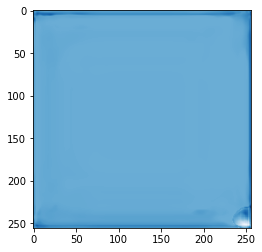

torch.Size([19, 256, 256])


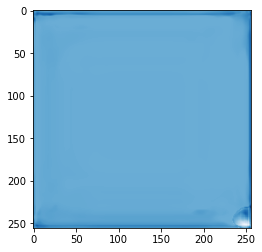

torch.Size([19, 256, 256])


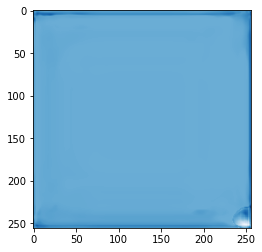

torch.Size([19, 256, 256])


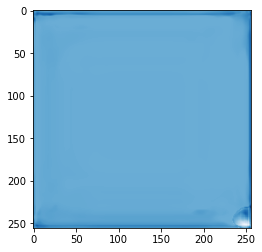

torch.Size([19, 256, 256])


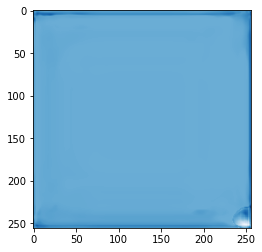

torch.Size([19, 256, 256])


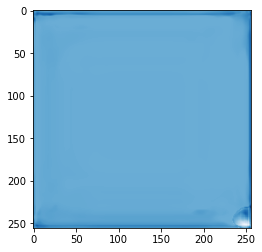

torch.Size([19, 256, 256])


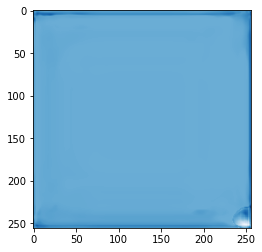

torch.Size([19, 256, 256])


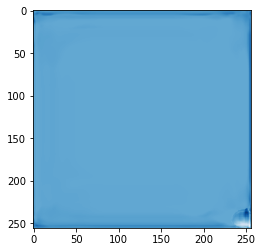

torch.Size([19, 256, 256])


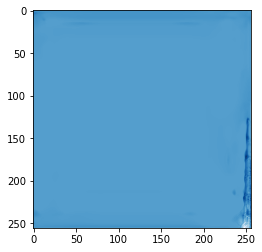

torch.Size([19, 256, 256])


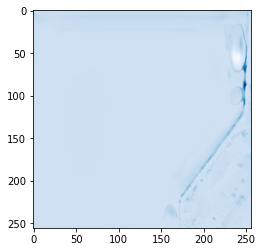

torch.Size([19, 256, 256])


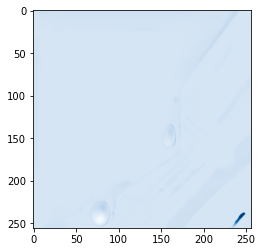

torch.Size([19, 256, 256])


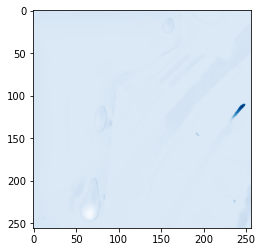

torch.Size([19, 256, 256])


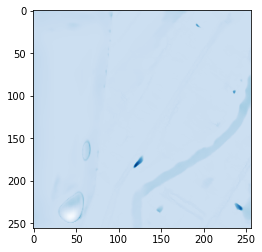

torch.Size([19, 256, 256])


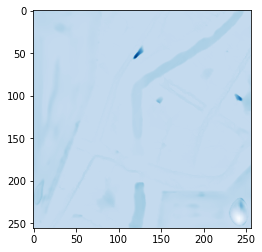

torch.Size([19, 256, 256])


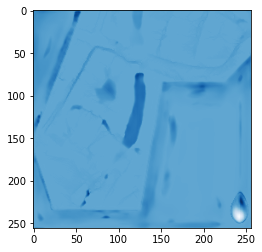

torch.Size([19, 256, 256])


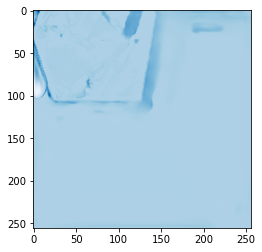

torch.Size([19, 256, 256])


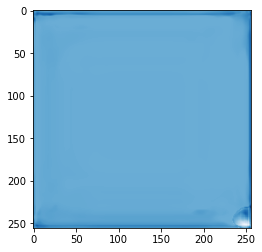

torch.Size([19, 256, 256])


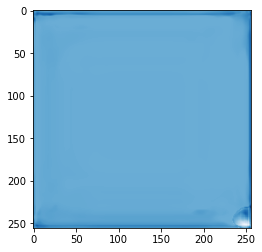

torch.Size([19, 256, 256])


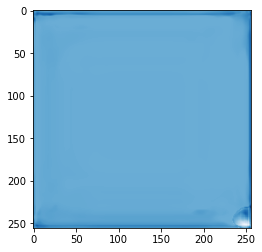

torch.Size([19, 256, 256])


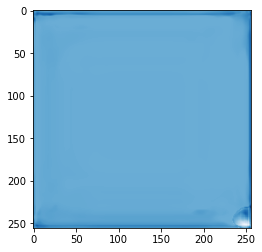

torch.Size([19, 256, 256])


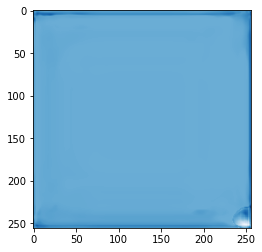

torch.Size([19, 256, 256])


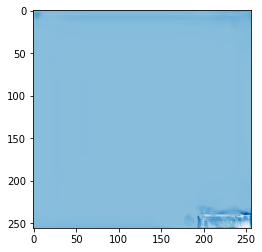

torch.Size([19, 256, 256])


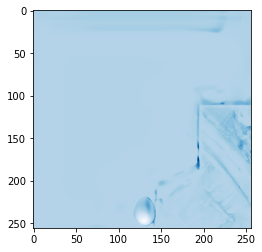

torch.Size([19, 256, 256])


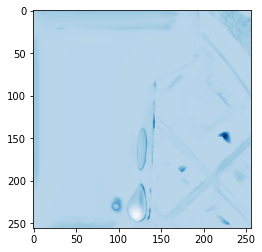

torch.Size([19, 256, 256])


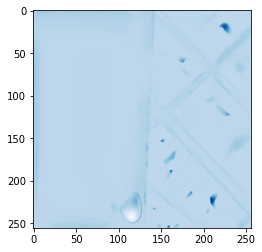

torch.Size([19, 256, 256])


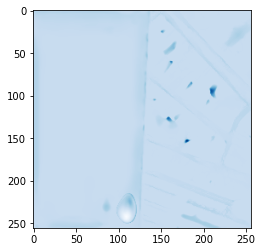

torch.Size([19, 256, 256])


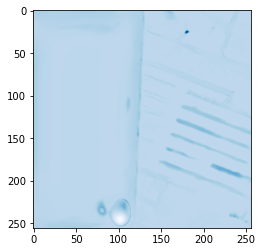

torch.Size([19, 256, 256])


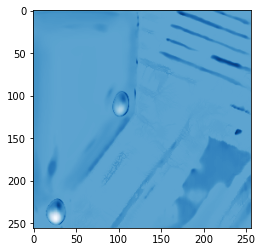

torch.Size([19, 256, 256])


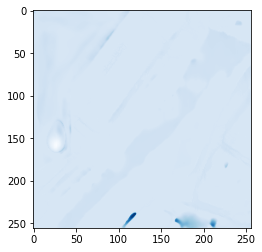

torch.Size([19, 256, 256])


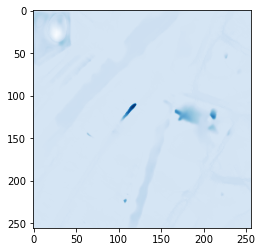

torch.Size([19, 256, 256])


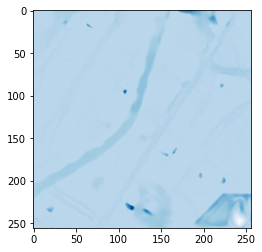

torch.Size([19, 256, 256])


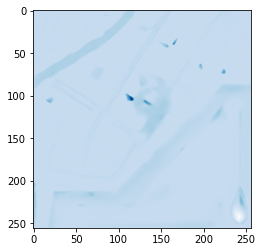

torch.Size([19, 256, 256])


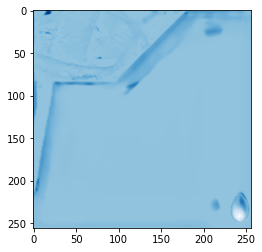

torch.Size([19, 256, 256])


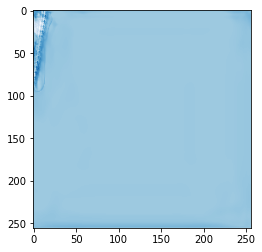

torch.Size([19, 256, 256])


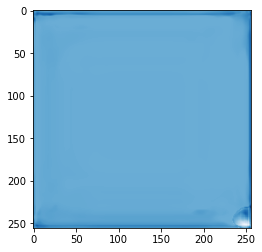

torch.Size([19, 256, 256])


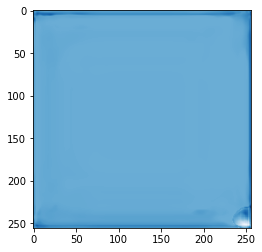

torch.Size([19, 256, 256])


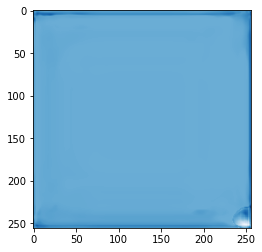

torch.Size([19, 256, 256])


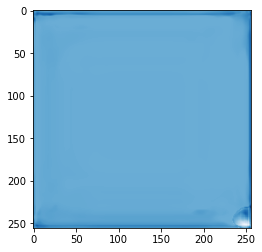

torch.Size([19, 256, 256])


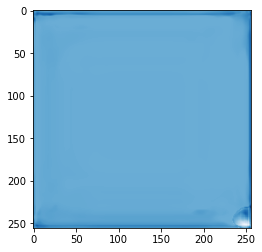

torch.Size([19, 256, 256])


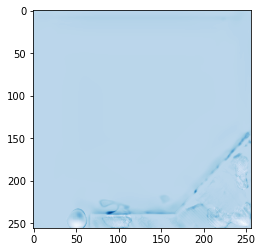

torch.Size([19, 256, 256])


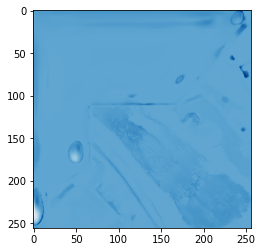

torch.Size([19, 256, 256])


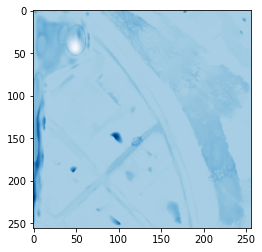

torch.Size([19, 256, 256])


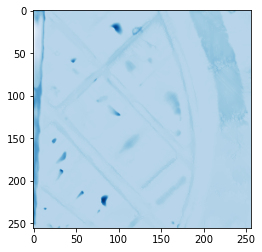

torch.Size([19, 256, 256])


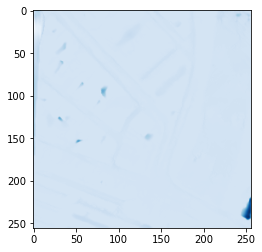

torch.Size([19, 256, 256])


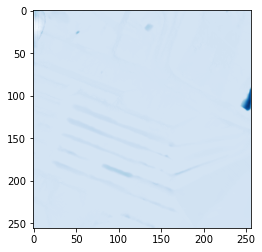

torch.Size([19, 256, 256])


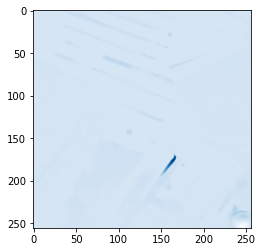

torch.Size([19, 256, 256])


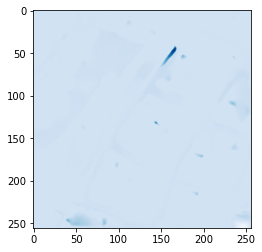

torch.Size([19, 256, 256])


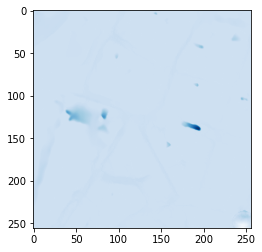

torch.Size([19, 256, 256])


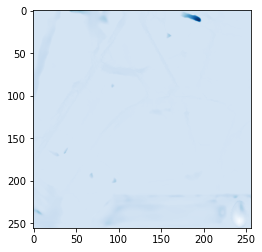

torch.Size([19, 256, 256])


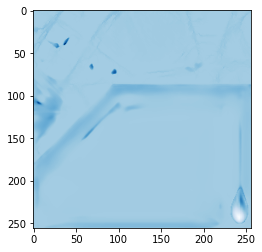

torch.Size([19, 256, 256])


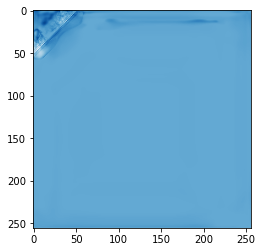

torch.Size([19, 256, 256])


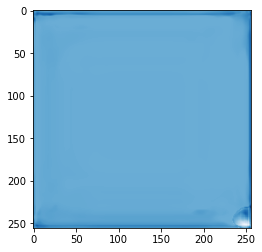

torch.Size([19, 256, 256])


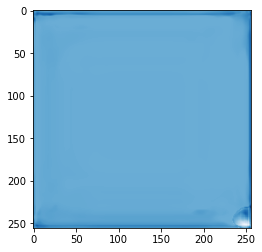

torch.Size([19, 256, 256])


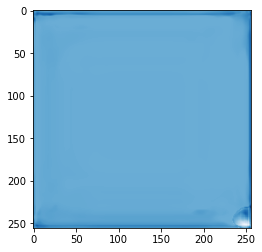

torch.Size([19, 256, 256])


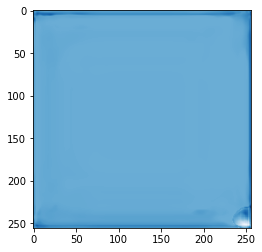

torch.Size([19, 256, 256])


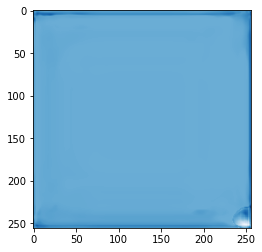

torch.Size([19, 256, 256])


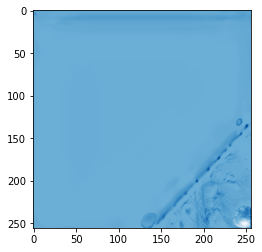

torch.Size([19, 256, 256])


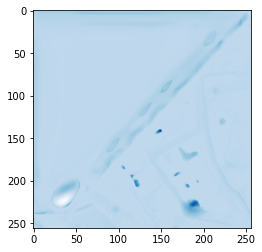

torch.Size([19, 256, 256])


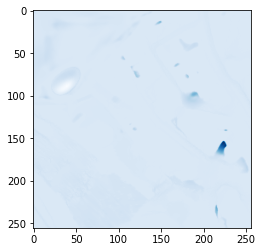

torch.Size([19, 256, 256])


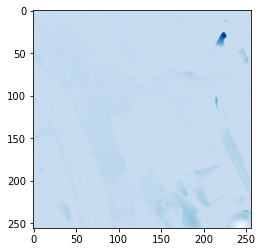

torch.Size([19, 256, 256])


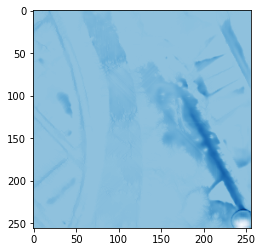

torch.Size([19, 256, 256])


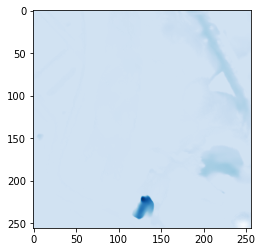

torch.Size([19, 256, 256])


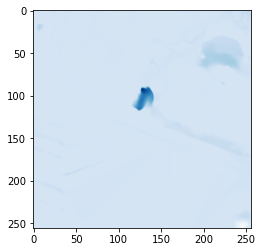

torch.Size([19, 256, 256])


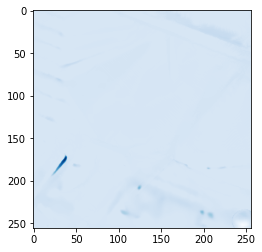

torch.Size([19, 256, 256])


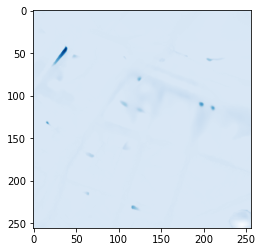

torch.Size([19, 256, 256])


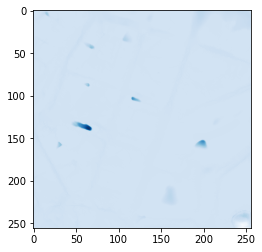

torch.Size([19, 256, 256])


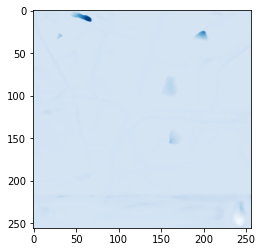

torch.Size([19, 256, 256])


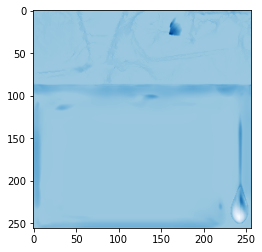

torch.Size([19, 256, 256])


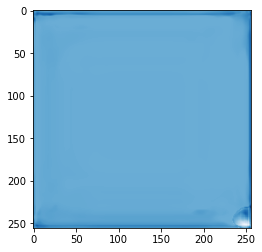

torch.Size([19, 256, 256])


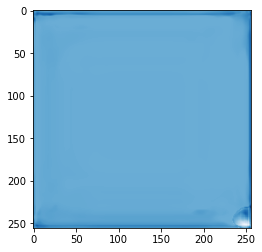

torch.Size([19, 256, 256])


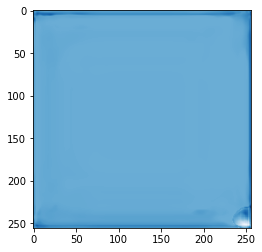

torch.Size([19, 256, 256])


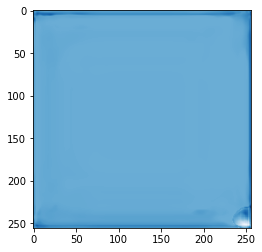

torch.Size([19, 256, 256])


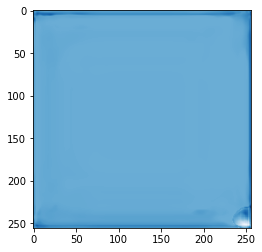

torch.Size([19, 256, 256])


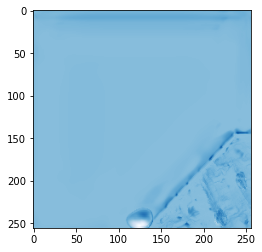

torch.Size([19, 256, 256])


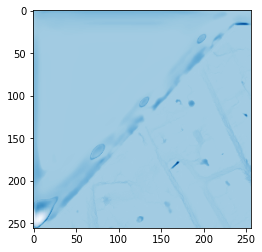

torch.Size([19, 256, 256])


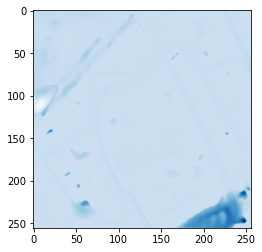

torch.Size([19, 256, 256])


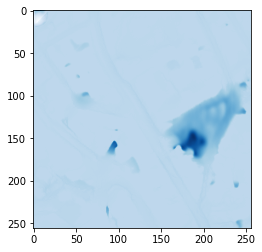

torch.Size([19, 256, 256])


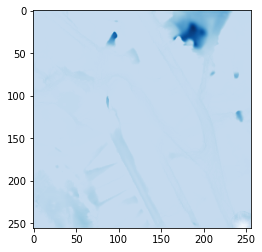

torch.Size([19, 256, 256])


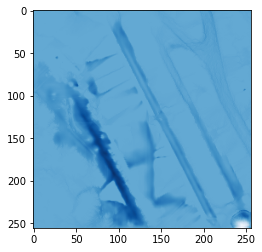

torch.Size([19, 256, 256])


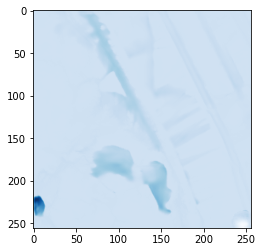

torch.Size([19, 256, 256])


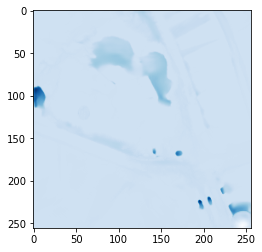

torch.Size([19, 256, 256])


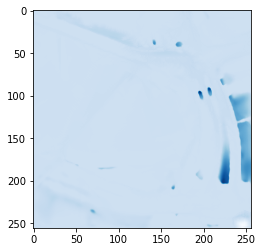

torch.Size([19, 256, 256])


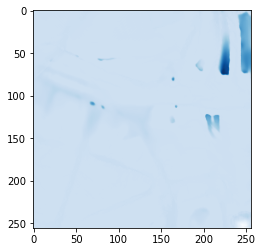

torch.Size([19, 256, 256])


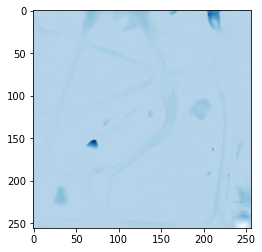

torch.Size([19, 256, 256])


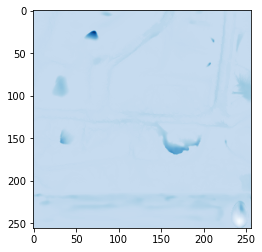

torch.Size([19, 256, 256])


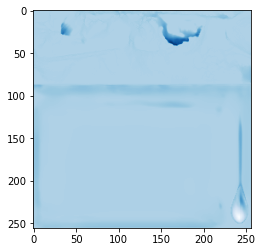

torch.Size([19, 256, 256])


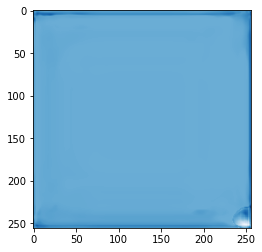

torch.Size([19, 256, 256])


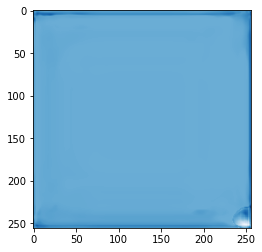

torch.Size([19, 256, 256])


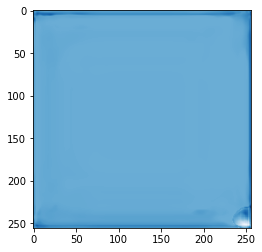

torch.Size([19, 256, 256])


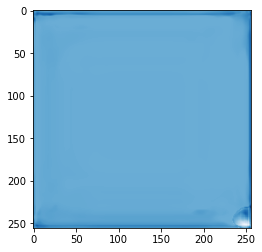

torch.Size([19, 256, 256])


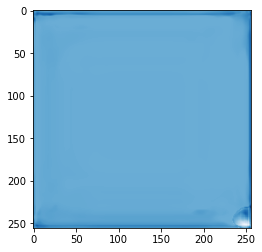

torch.Size([19, 256, 256])


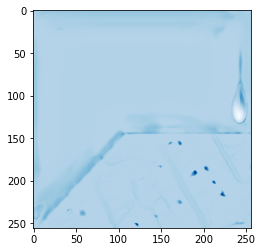

torch.Size([19, 256, 256])


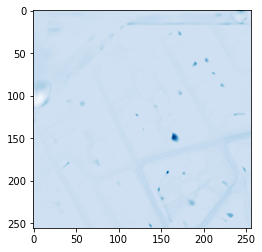

torch.Size([19, 256, 256])


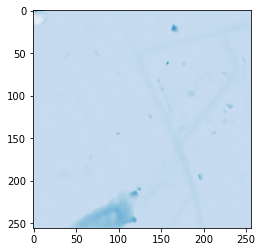

torch.Size([19, 256, 256])


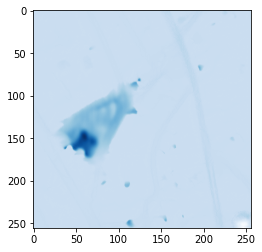

torch.Size([19, 256, 256])


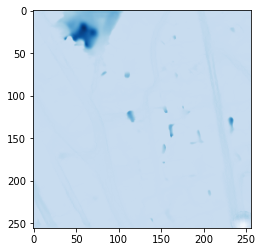

torch.Size([19, 256, 256])


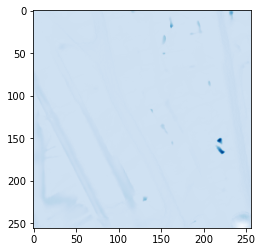

torch.Size([19, 256, 256])


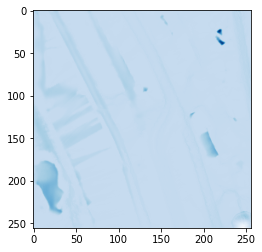

torch.Size([19, 256, 256])


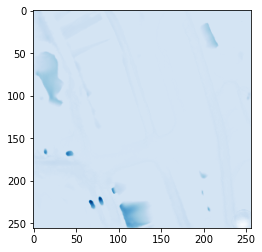

torch.Size([19, 256, 256])


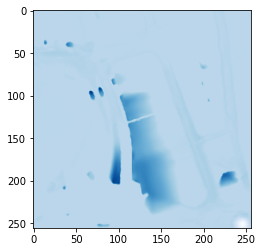

torch.Size([19, 256, 256])


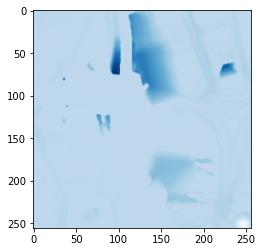

torch.Size([19, 256, 256])


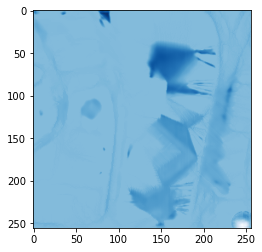

torch.Size([19, 256, 256])


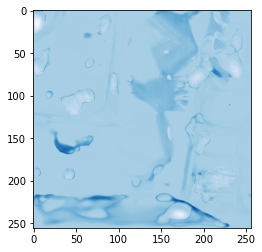

torch.Size([19, 256, 256])


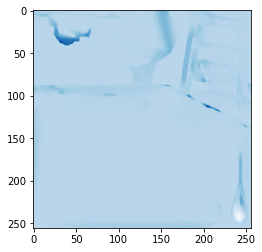

torch.Size([19, 256, 256])


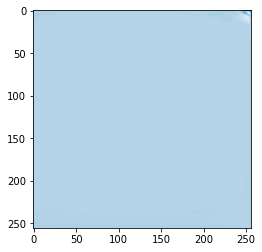

torch.Size([19, 256, 256])


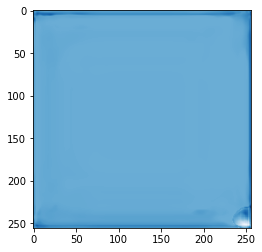

torch.Size([19, 256, 256])


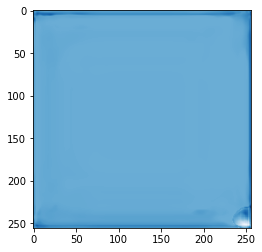

torch.Size([19, 256, 256])


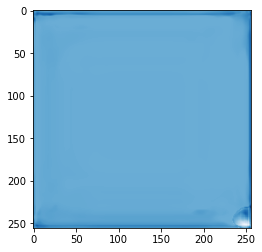

torch.Size([19, 256, 256])


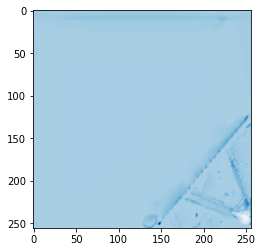

torch.Size([19, 256, 256])


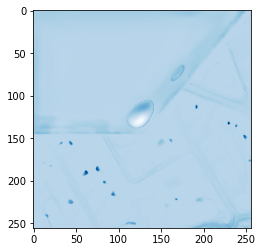

torch.Size([19, 256, 256])


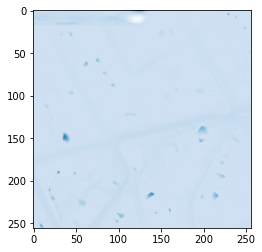

torch.Size([19, 256, 256])


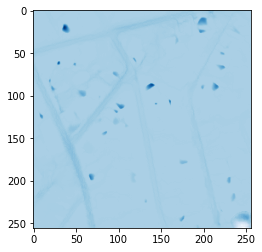

torch.Size([19, 256, 256])


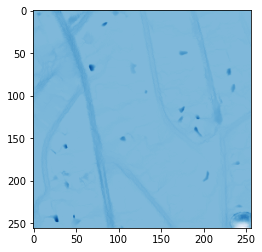

torch.Size([19, 256, 256])


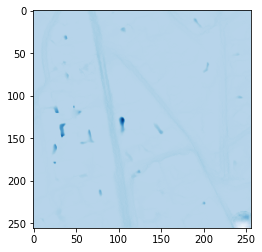

torch.Size([19, 256, 256])


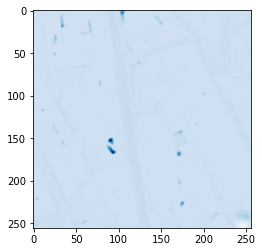

torch.Size([19, 256, 256])


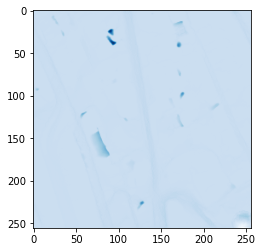

torch.Size([19, 256, 256])


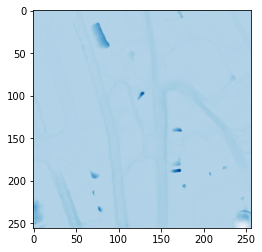

torch.Size([19, 256, 256])


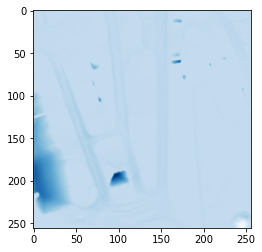

torch.Size([19, 256, 256])


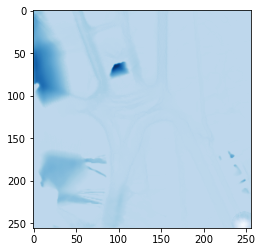

torch.Size([19, 256, 256])


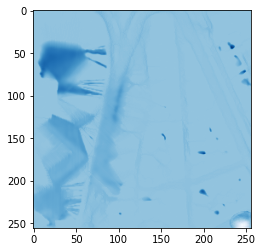

torch.Size([19, 256, 256])


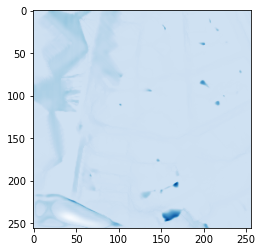

torch.Size([19, 256, 256])


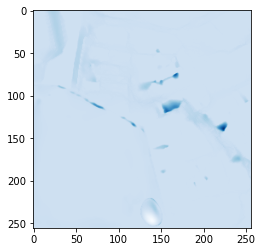

torch.Size([19, 256, 256])


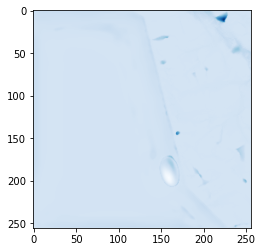

torch.Size([19, 256, 256])


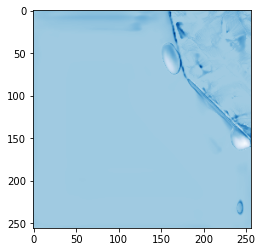

torch.Size([19, 256, 256])


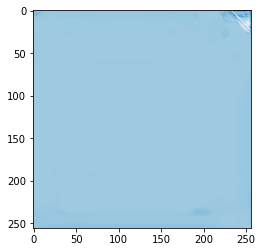

torch.Size([19, 256, 256])


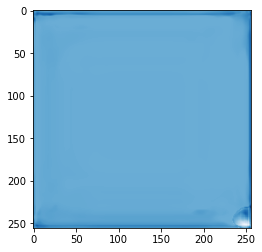

torch.Size([19, 256, 256])


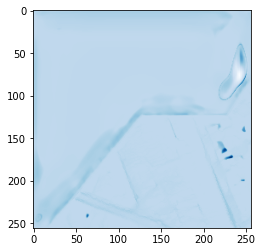

torch.Size([19, 256, 256])


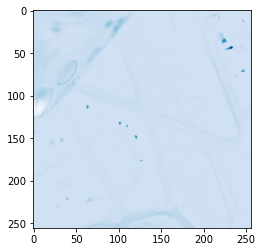

torch.Size([19, 256, 256])


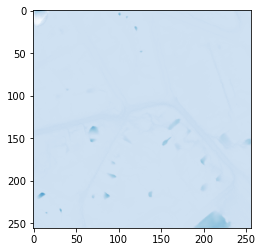

torch.Size([19, 256, 256])


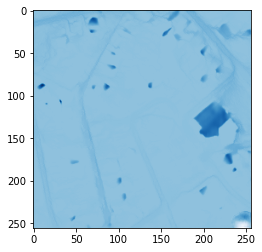

torch.Size([19, 256, 256])


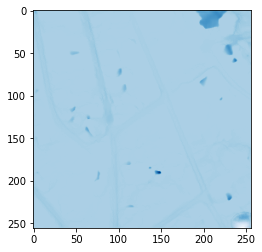

torch.Size([19, 256, 256])


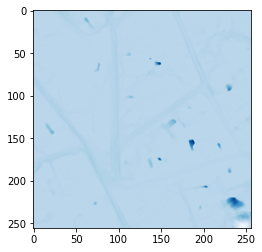

torch.Size([19, 256, 256])


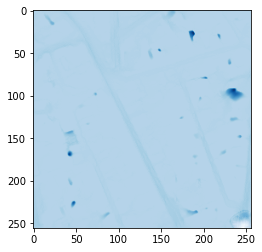

torch.Size([19, 256, 256])


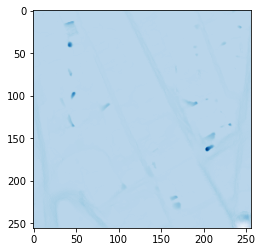

torch.Size([19, 256, 256])


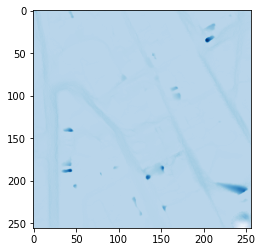

torch.Size([19, 256, 256])


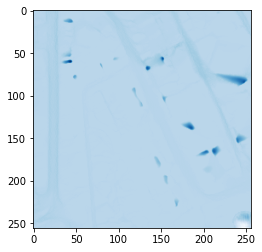

torch.Size([19, 256, 256])


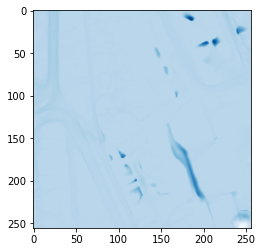

torch.Size([19, 256, 256])


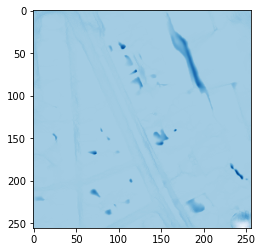

torch.Size([19, 256, 256])


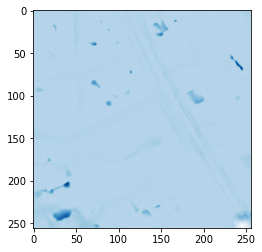

torch.Size([19, 256, 256])


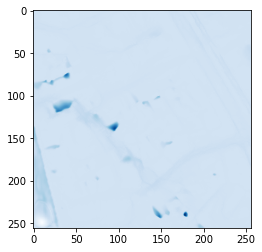

torch.Size([19, 256, 256])


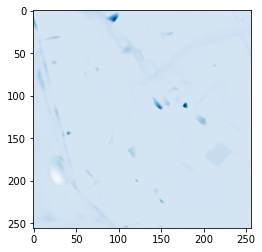

torch.Size([19, 256, 256])


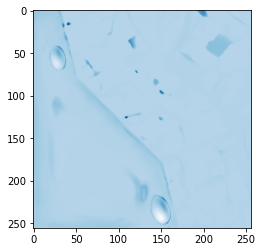

torch.Size([19, 256, 256])


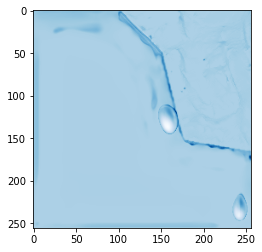

torch.Size([19, 256, 256])


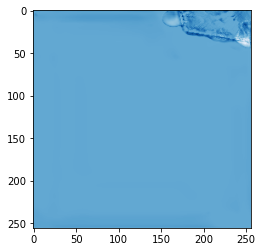

torch.Size([19, 256, 256])


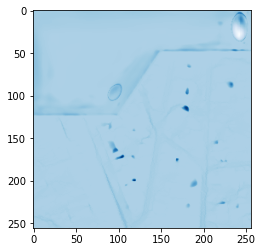

torch.Size([19, 256, 256])


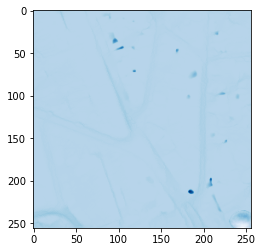

torch.Size([19, 256, 256])


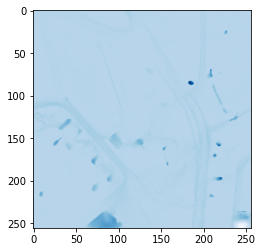

torch.Size([19, 256, 256])


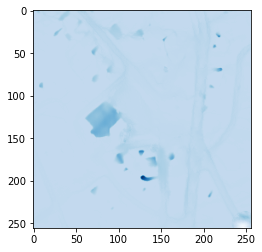

torch.Size([19, 256, 256])


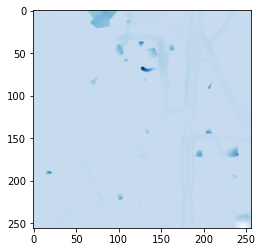

torch.Size([19, 256, 256])


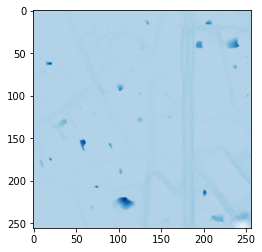

torch.Size([19, 256, 256])


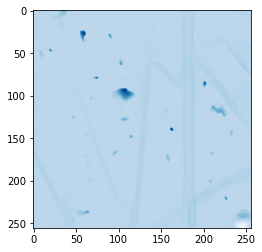

torch.Size([19, 256, 256])


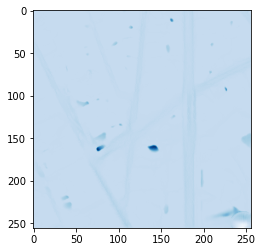

torch.Size([19, 256, 256])


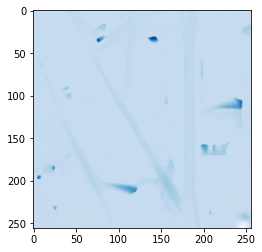

torch.Size([19, 256, 256])


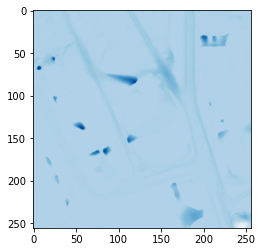

torch.Size([19, 256, 256])


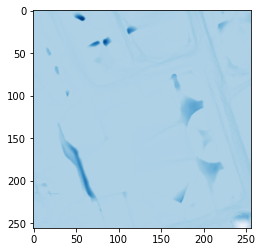

torch.Size([19, 256, 256])


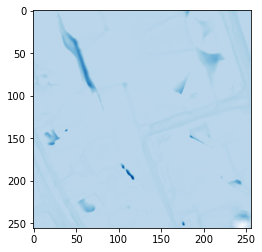

torch.Size([19, 256, 256])


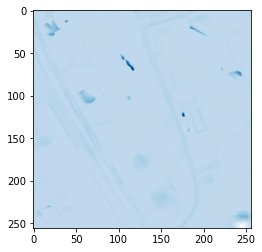

torch.Size([19, 256, 256])


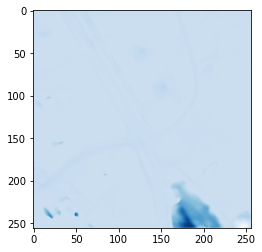

torch.Size([19, 256, 256])


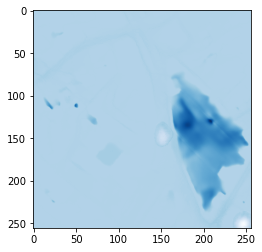

torch.Size([19, 256, 256])


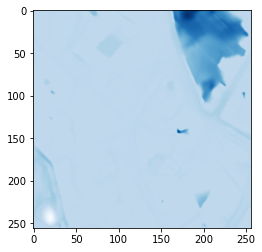

torch.Size([19, 256, 256])


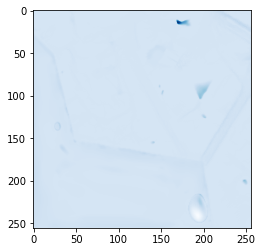

torch.Size([19, 256, 256])


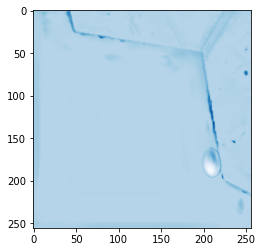

torch.Size([19, 256, 256])


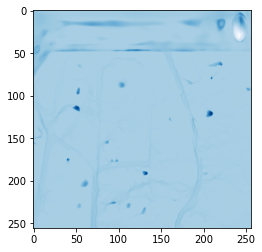

torch.Size([19, 256, 256])


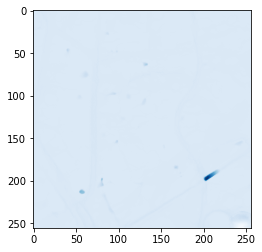

torch.Size([19, 256, 256])


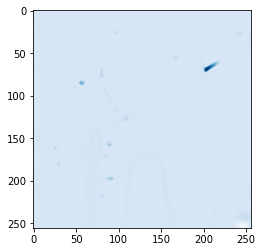

torch.Size([19, 256, 256])


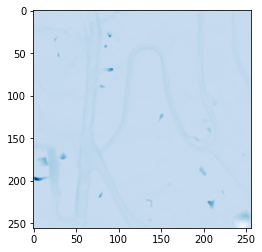

torch.Size([19, 256, 256])


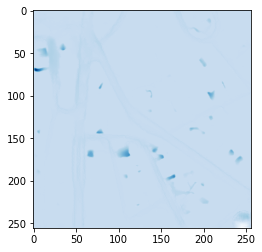

torch.Size([19, 256, 256])


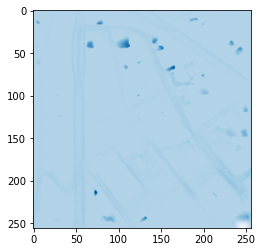

torch.Size([19, 256, 256])


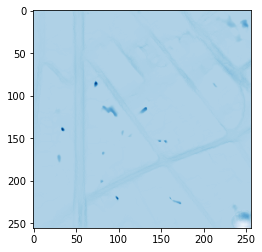

torch.Size([19, 256, 256])


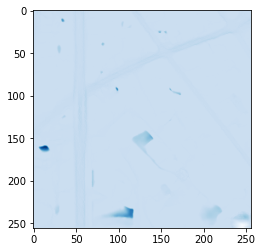

torch.Size([19, 256, 256])


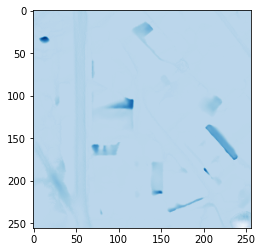

torch.Size([19, 256, 256])


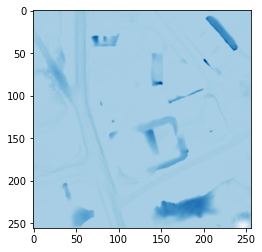

torch.Size([19, 256, 256])


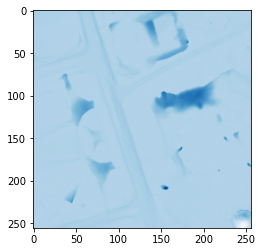

torch.Size([19, 256, 256])


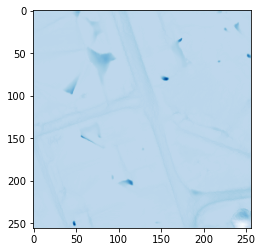

torch.Size([19, 256, 256])


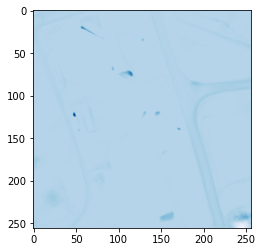

torch.Size([19, 256, 256])


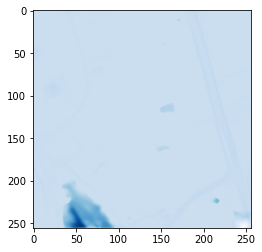

torch.Size([19, 256, 256])


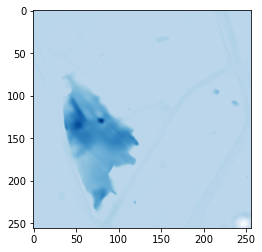

torch.Size([19, 256, 256])


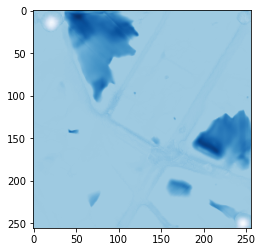

torch.Size([19, 256, 256])


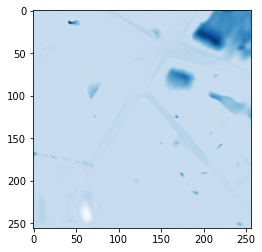

torch.Size([19, 256, 256])


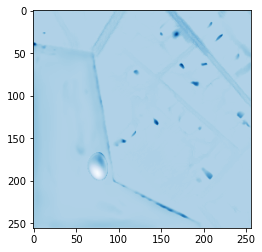

torch.Size([19, 256, 256])


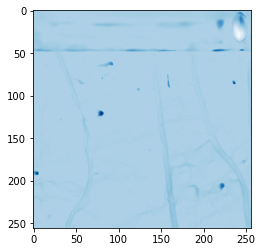

torch.Size([19, 256, 256])


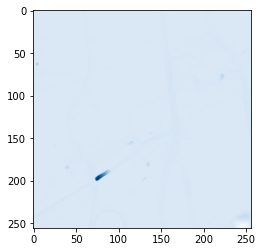

torch.Size([19, 256, 256])


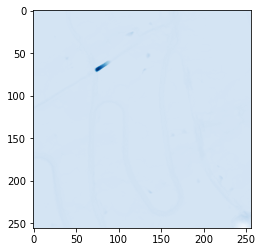

torch.Size([19, 256, 256])


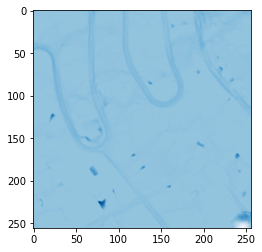

torch.Size([19, 256, 256])


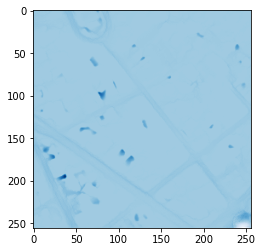

torch.Size([19, 256, 256])


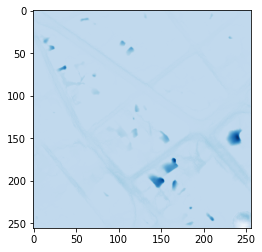

torch.Size([19, 256, 256])


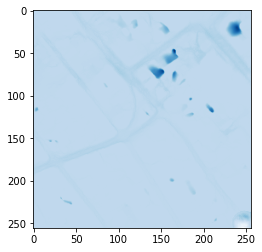

torch.Size([19, 256, 256])


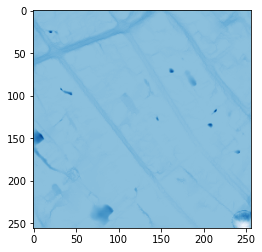

torch.Size([19, 256, 256])


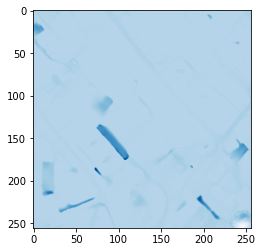

torch.Size([19, 256, 256])


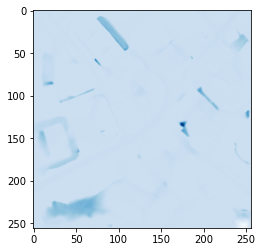

torch.Size([19, 256, 256])


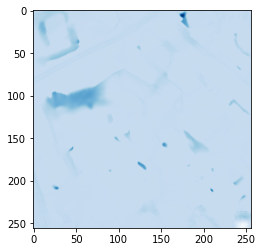

torch.Size([19, 256, 256])


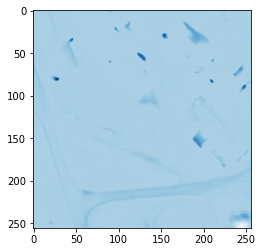

torch.Size([19, 256, 256])


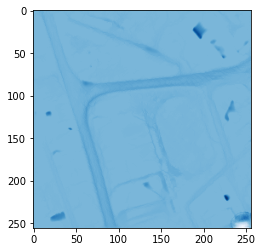

torch.Size([19, 256, 256])


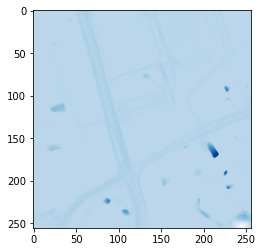

torch.Size([19, 256, 256])


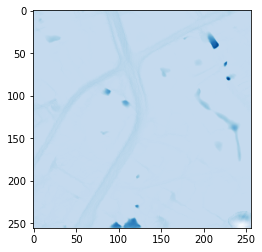

torch.Size([19, 256, 256])


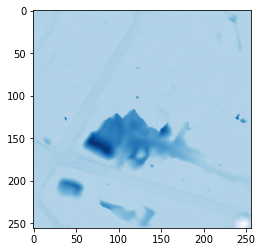

torch.Size([19, 256, 256])


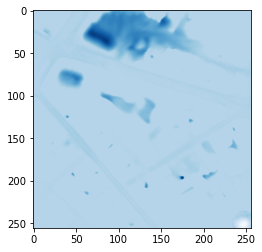

torch.Size([19, 256, 256])


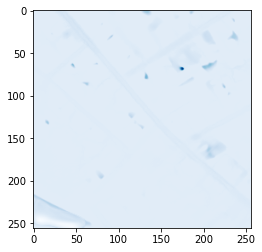

torch.Size([19, 256, 256])


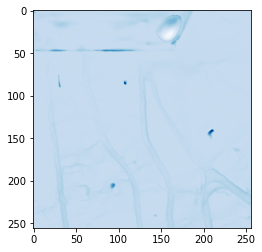

torch.Size([19, 256, 256])


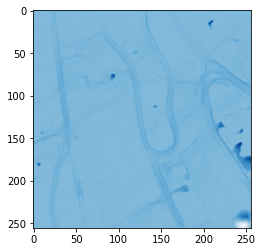

torch.Size([19, 256, 256])


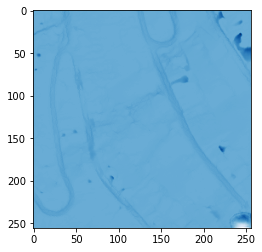

torch.Size([19, 256, 256])


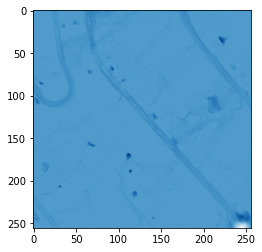

torch.Size([19, 256, 256])


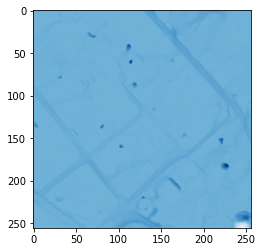

torch.Size([19, 256, 256])


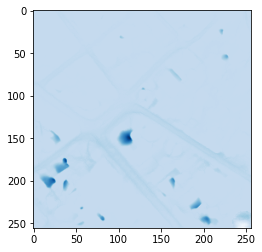

torch.Size([19, 256, 256])


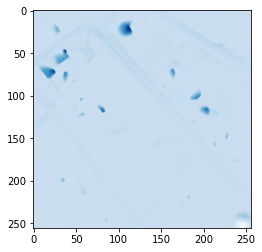

torch.Size([19, 256, 256])


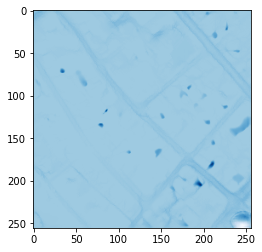

torch.Size([19, 256, 256])


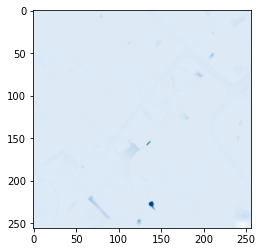

torch.Size([19, 256, 256])


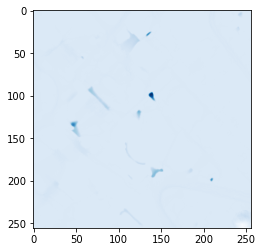

torch.Size([19, 256, 256])


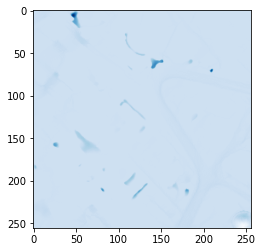

torch.Size([19, 256, 256])


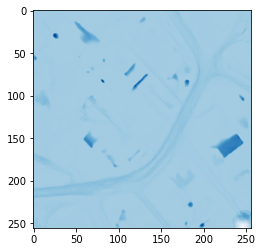

torch.Size([19, 256, 256])


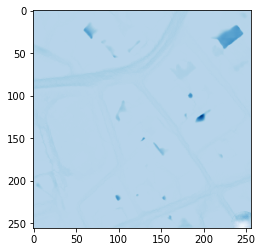

torch.Size([19, 256, 256])


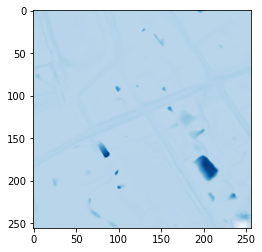

torch.Size([19, 256, 256])


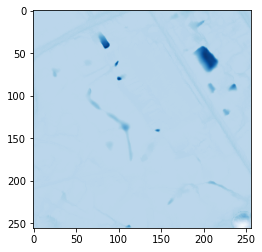

torch.Size([19, 256, 256])


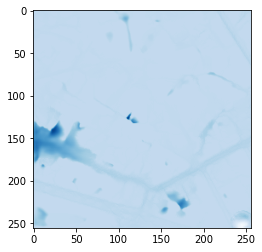

torch.Size([19, 256, 256])


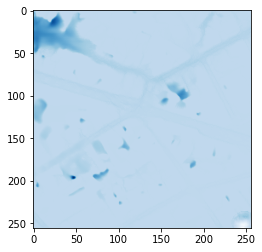

torch.Size([19, 256, 256])


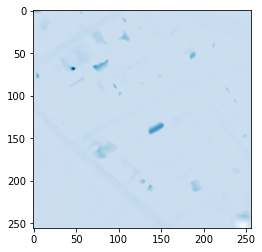

torch.Size([19, 256, 256])


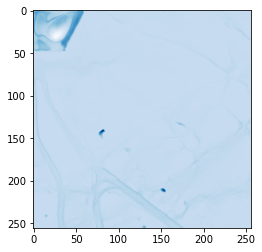

torch.Size([19, 256, 256])


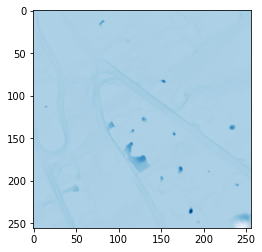

torch.Size([19, 256, 256])


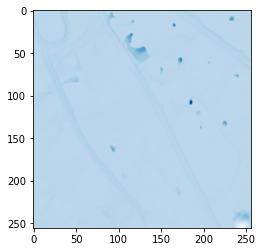

torch.Size([19, 256, 256])


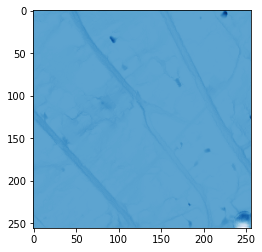

torch.Size([19, 256, 256])


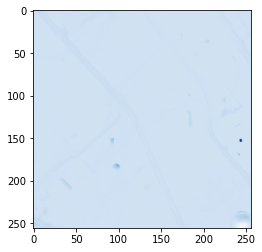

torch.Size([19, 256, 256])


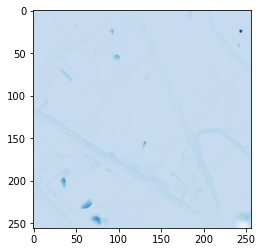

torch.Size([19, 256, 256])


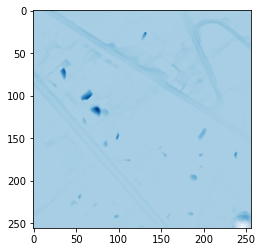

torch.Size([19, 256, 256])


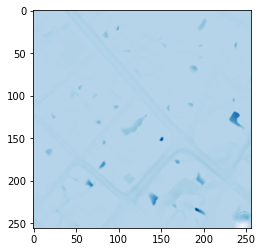

torch.Size([19, 256, 256])


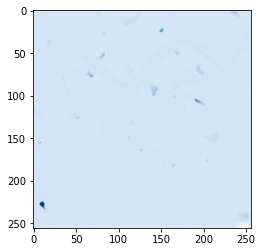

torch.Size([19, 256, 256])


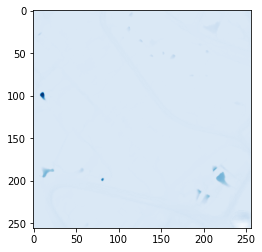

torch.Size([19, 256, 256])


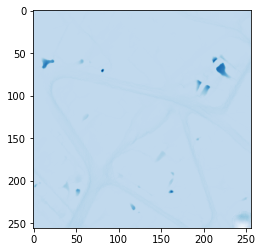

torch.Size([19, 256, 256])


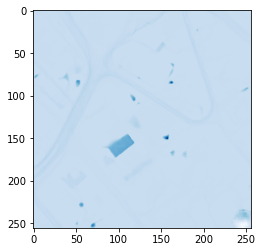

torch.Size([19, 256, 256])


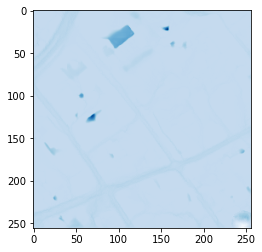

torch.Size([19, 256, 256])


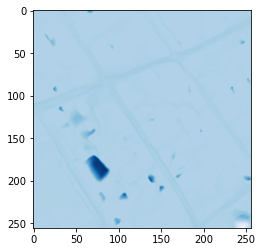

torch.Size([19, 256, 256])


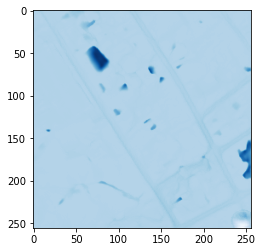

torch.Size([19, 256, 256])


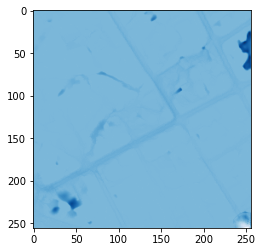

torch.Size([19, 256, 256])


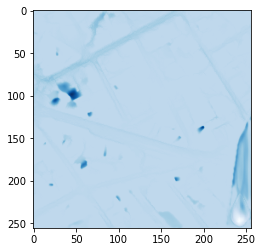

torch.Size([19, 256, 256])


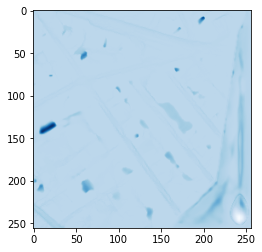

torch.Size([19, 256, 256])


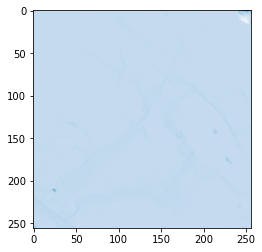

torch.Size([19, 256, 256])


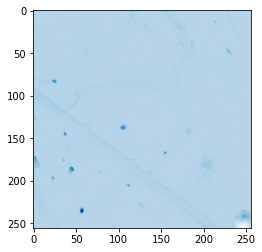

torch.Size([19, 256, 256])


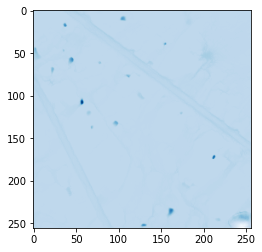

torch.Size([19, 256, 256])


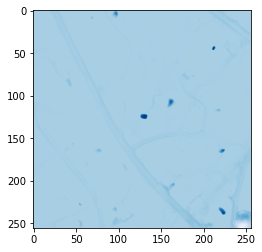

torch.Size([19, 256, 256])


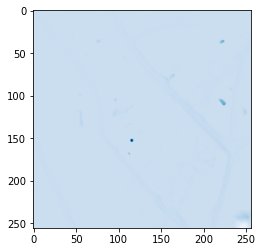

torch.Size([19, 256, 256])


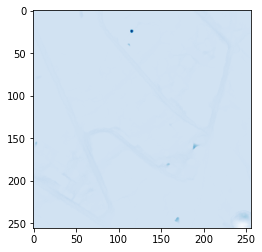

torch.Size([19, 256, 256])


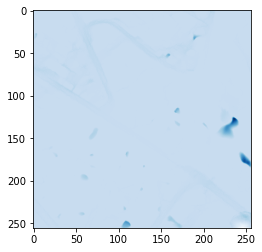

torch.Size([19, 256, 256])


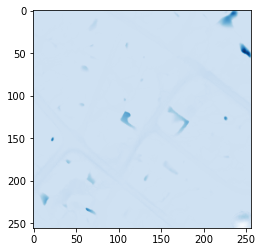

torch.Size([19, 256, 256])


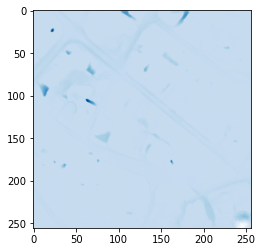

torch.Size([19, 256, 256])


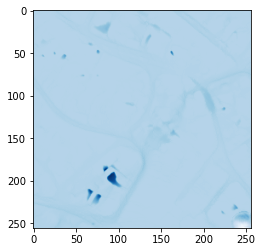

torch.Size([19, 256, 256])


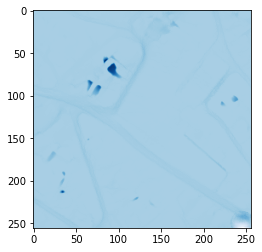

torch.Size([19, 256, 256])


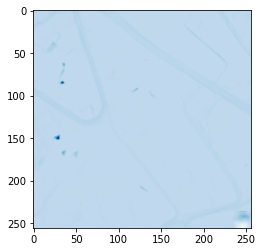

torch.Size([19, 256, 256])


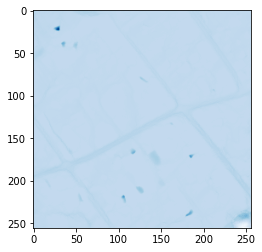

torch.Size([19, 256, 256])


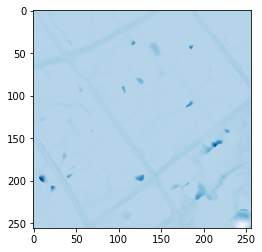

torch.Size([19, 256, 256])


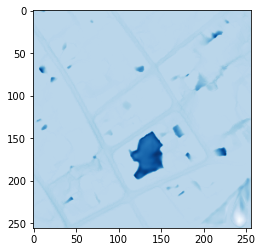

torch.Size([19, 256, 256])


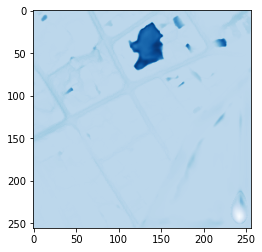

torch.Size([19, 256, 256])


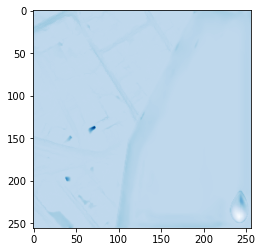

torch.Size([19, 256, 256])


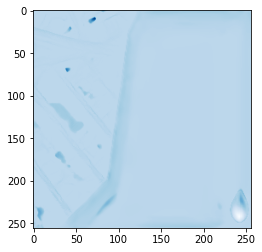

torch.Size([19, 256, 256])


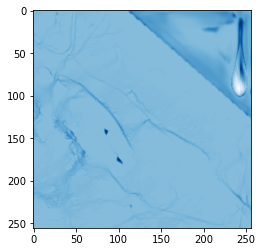

torch.Size([19, 256, 256])


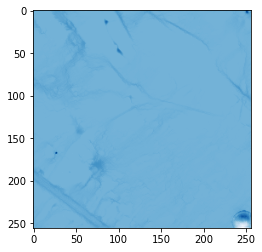

torch.Size([19, 256, 256])


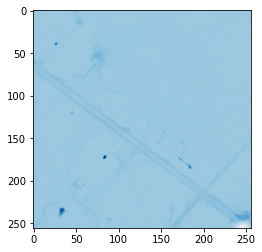

torch.Size([19, 256, 256])


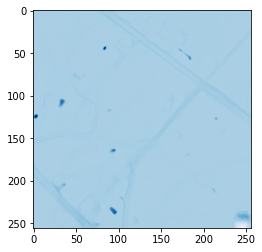

torch.Size([19, 256, 256])


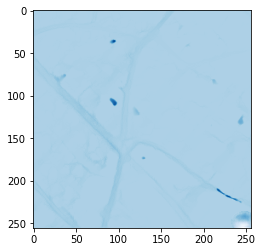

torch.Size([19, 256, 256])


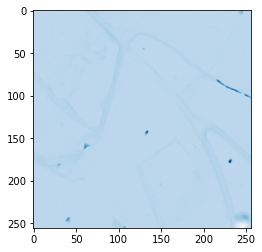

torch.Size([19, 256, 256])


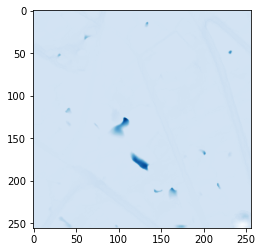

torch.Size([19, 256, 256])


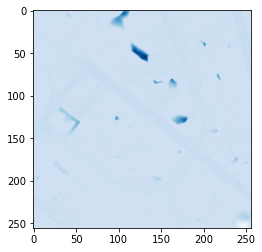

torch.Size([19, 256, 256])


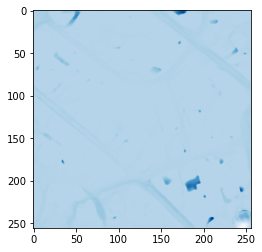

torch.Size([19, 256, 256])


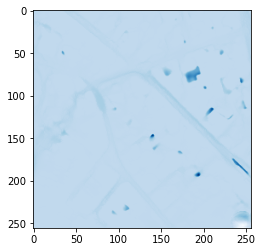

torch.Size([19, 256, 256])


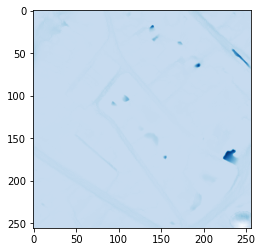

torch.Size([19, 256, 256])


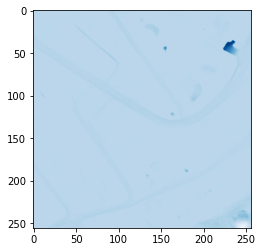

torch.Size([19, 256, 256])


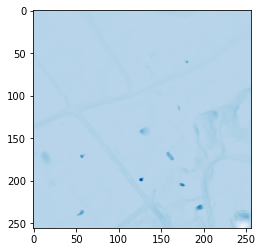

torch.Size([19, 256, 256])


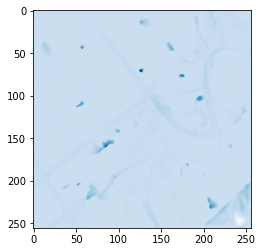

torch.Size([19, 256, 256])


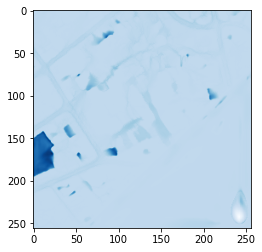

torch.Size([19, 256, 256])


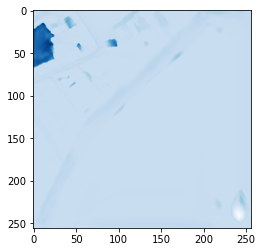

torch.Size([19, 256, 256])


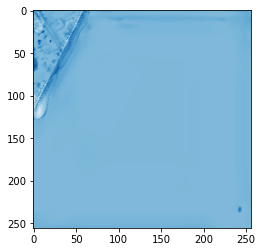

torch.Size([19, 256, 256])


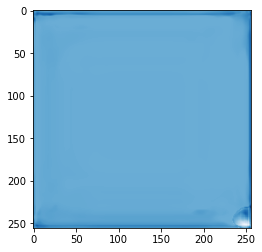

torch.Size([19, 256, 256])


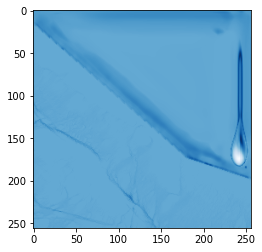

torch.Size([19, 256, 256])


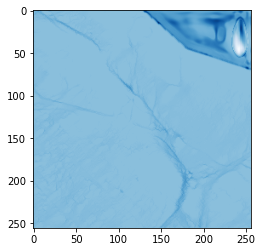

torch.Size([19, 256, 256])


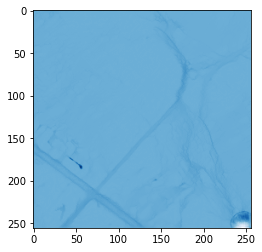

torch.Size([19, 256, 256])


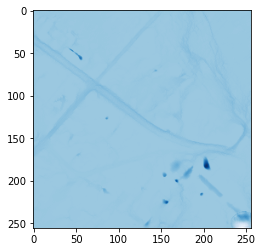

torch.Size([19, 256, 256])


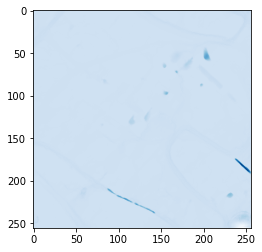

torch.Size([19, 256, 256])


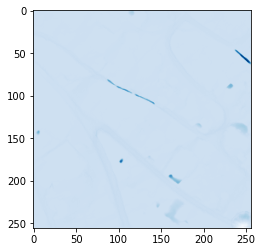

torch.Size([19, 256, 256])


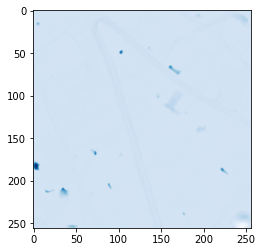

torch.Size([19, 256, 256])


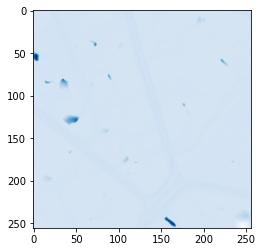

torch.Size([19, 256, 256])


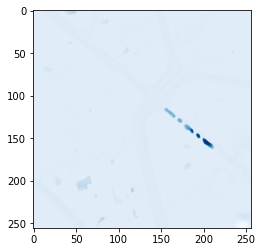

torch.Size([19, 256, 256])


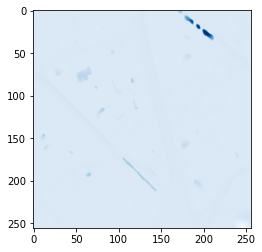

torch.Size([19, 256, 256])


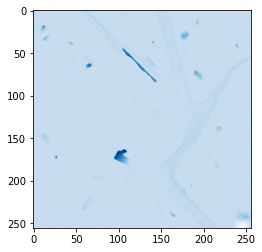

torch.Size([19, 256, 256])


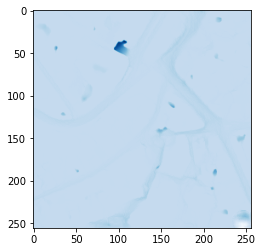

torch.Size([19, 256, 256])


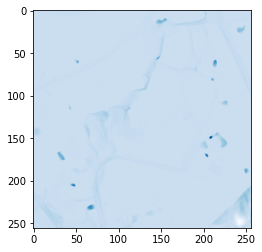

torch.Size([19, 256, 256])


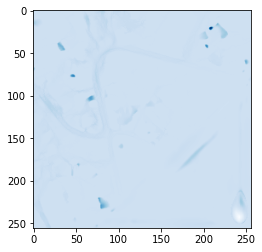

torch.Size([19, 256, 256])


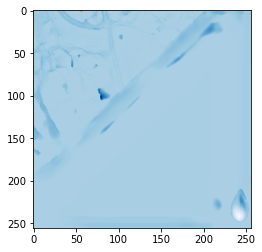

torch.Size([19, 256, 256])


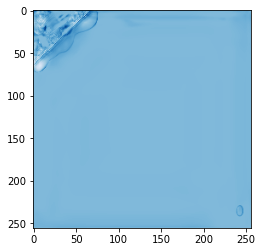

torch.Size([19, 256, 256])


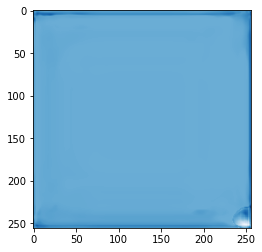

torch.Size([19, 256, 256])


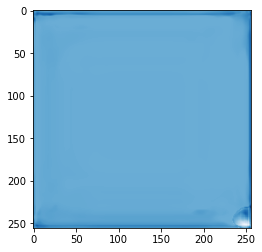

torch.Size([19, 256, 256])


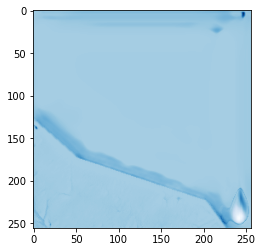

torch.Size([19, 256, 256])


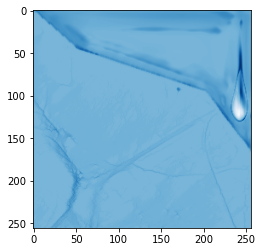

torch.Size([19, 256, 256])


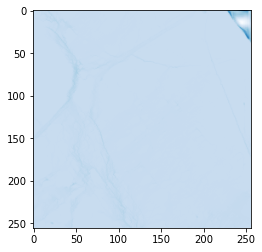

torch.Size([19, 256, 256])


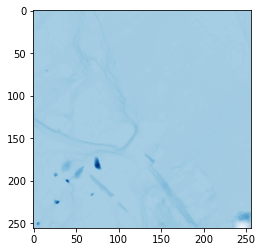

torch.Size([19, 256, 256])


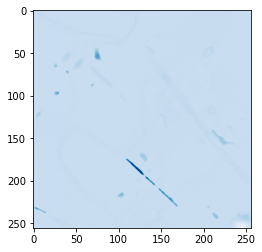

torch.Size([19, 256, 256])


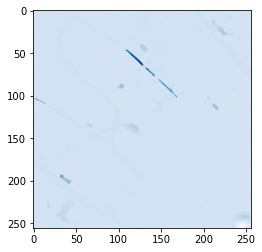

torch.Size([19, 256, 256])


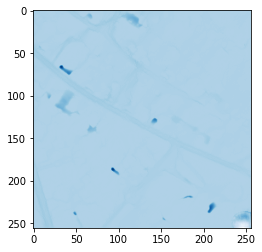

torch.Size([19, 256, 256])


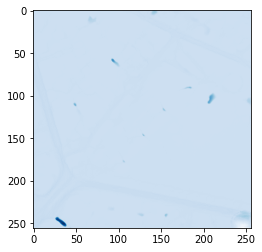

torch.Size([19, 256, 256])


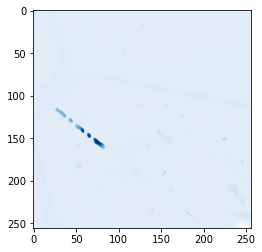

torch.Size([19, 256, 256])


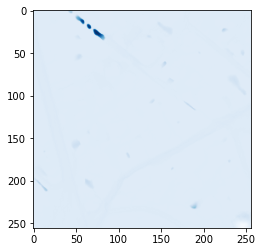

torch.Size([19, 256, 256])


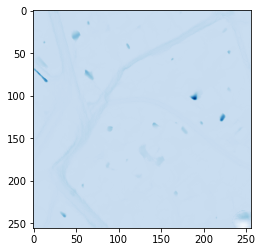

torch.Size([19, 256, 256])


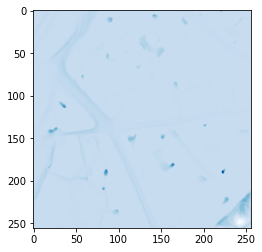

torch.Size([19, 256, 256])


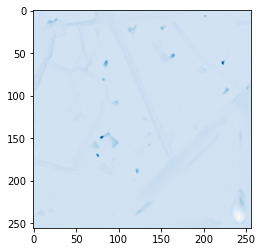

torch.Size([19, 256, 256])


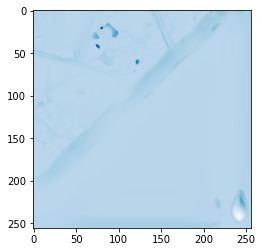

torch.Size([19, 256, 256])


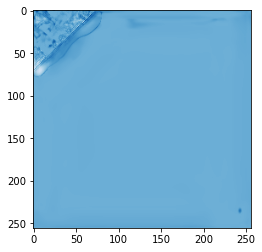

torch.Size([19, 256, 256])


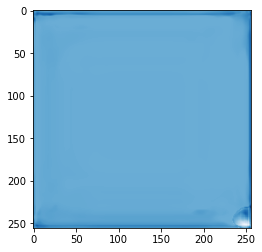

torch.Size([19, 256, 256])


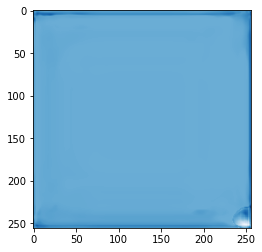

torch.Size([19, 256, 256])


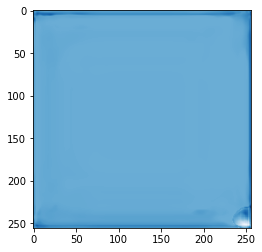

torch.Size([19, 256, 256])


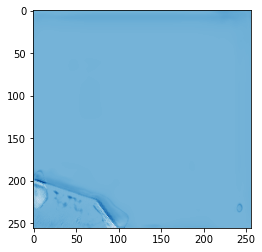

torch.Size([19, 256, 256])


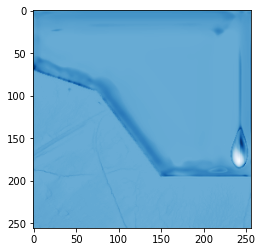

torch.Size([19, 256, 256])


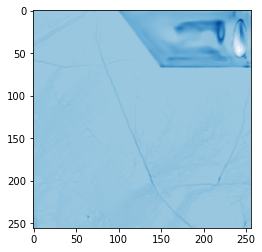

torch.Size([19, 256, 256])


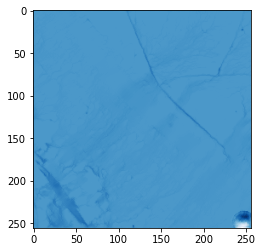

torch.Size([19, 256, 256])


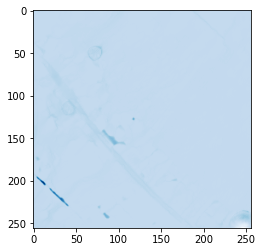

torch.Size([19, 256, 256])


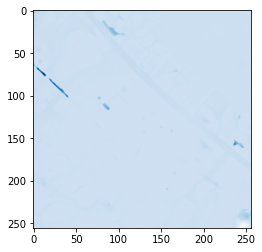

torch.Size([19, 256, 256])


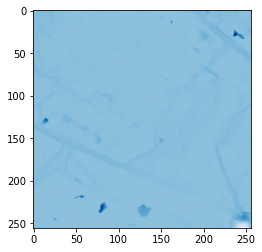

torch.Size([19, 256, 256])


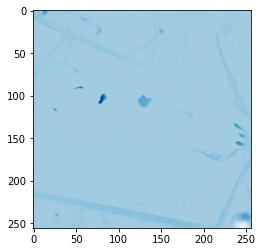

torch.Size([19, 256, 256])


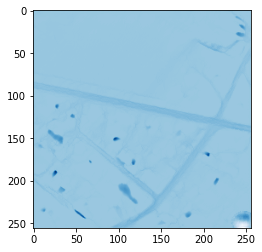

torch.Size([19, 256, 256])


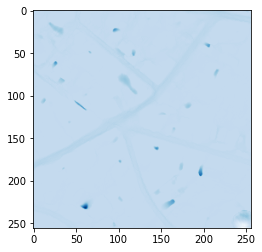

torch.Size([19, 256, 256])


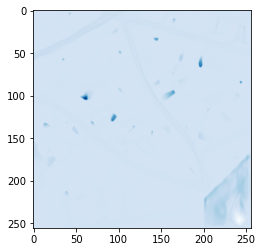

torch.Size([19, 256, 256])


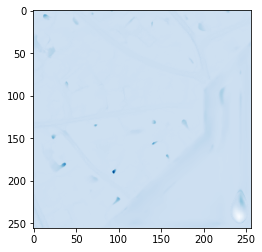

torch.Size([19, 256, 256])


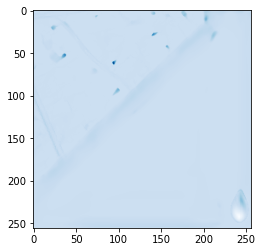

torch.Size([19, 256, 256])


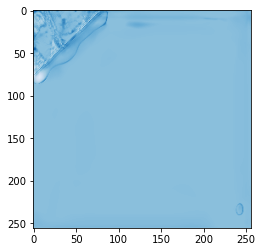

torch.Size([19, 256, 256])


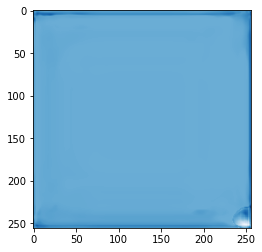

torch.Size([19, 256, 256])


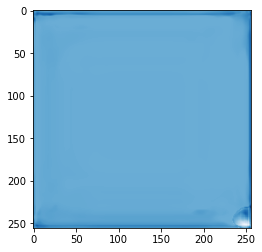

torch.Size([19, 256, 256])


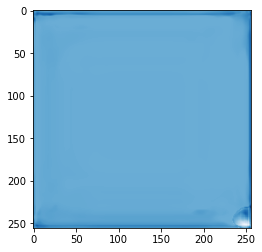

torch.Size([19, 256, 256])


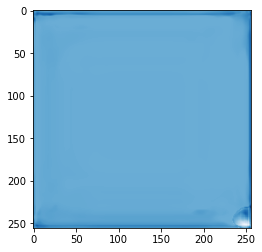

torch.Size([19, 256, 256])


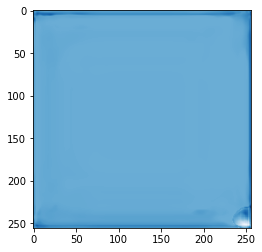

torch.Size([19, 256, 256])


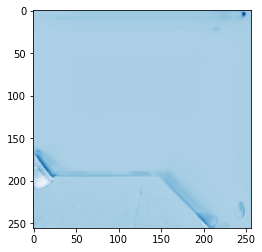

torch.Size([19, 256, 256])


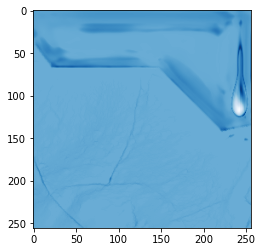

torch.Size([19, 256, 256])


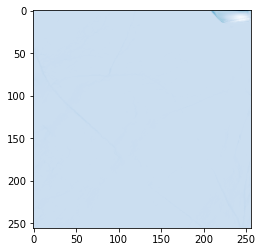

torch.Size([19, 256, 256])


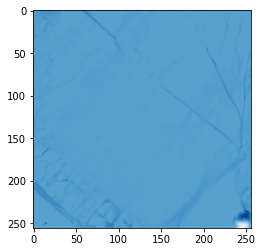

torch.Size([19, 256, 256])


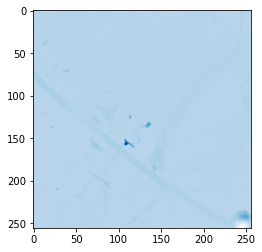

torch.Size([19, 256, 256])


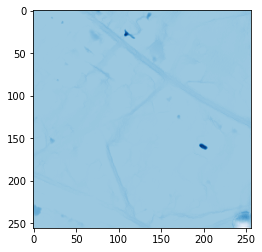

torch.Size([19, 256, 256])


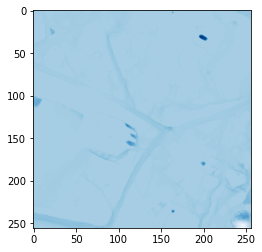

torch.Size([19, 256, 256])


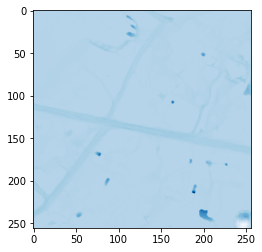

torch.Size([19, 256, 256])


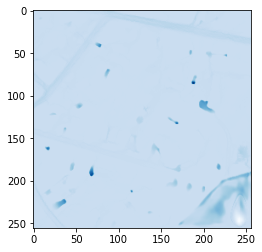

torch.Size([19, 256, 256])


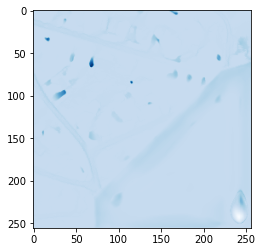

torch.Size([19, 256, 256])


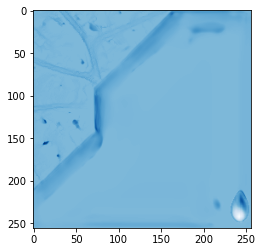

torch.Size([19, 256, 256])


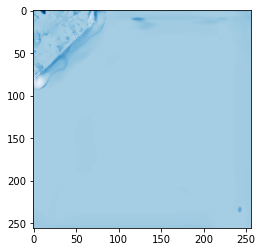

torch.Size([19, 256, 256])


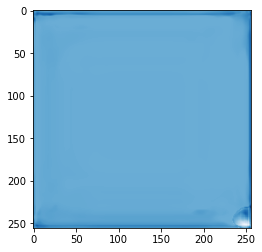

torch.Size([19, 256, 256])


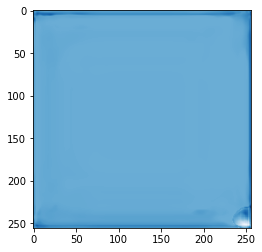

torch.Size([19, 256, 256])


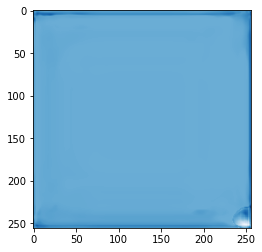

torch.Size([19, 256, 256])


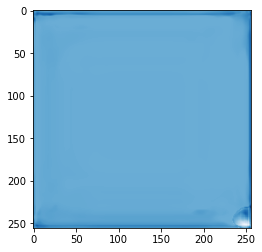

torch.Size([19, 256, 256])


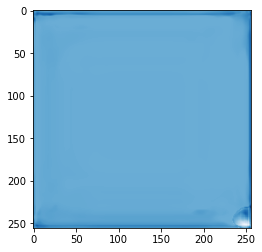

torch.Size([19, 256, 256])


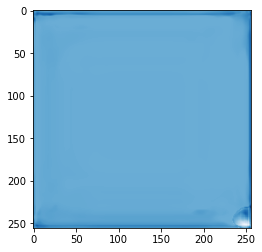

torch.Size([19, 256, 256])


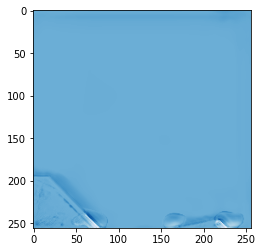

torch.Size([19, 256, 256])


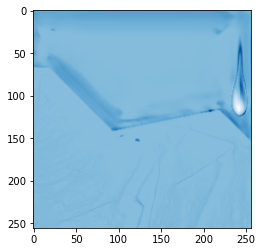

torch.Size([19, 256, 256])


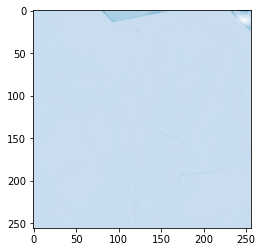

torch.Size([19, 256, 256])


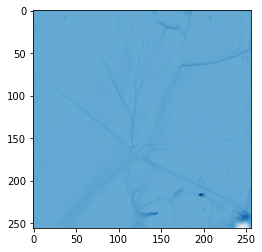

torch.Size([19, 256, 256])


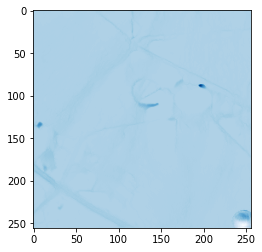

torch.Size([19, 256, 256])


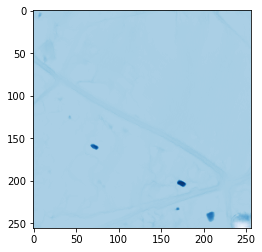

torch.Size([19, 256, 256])


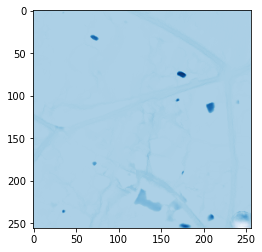

torch.Size([19, 256, 256])


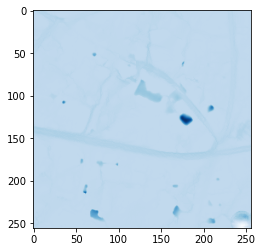

torch.Size([19, 256, 256])


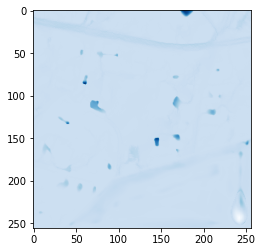

torch.Size([19, 256, 256])


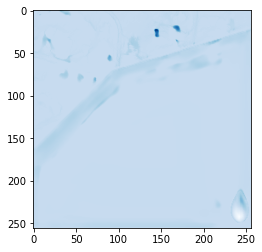

torch.Size([19, 256, 256])


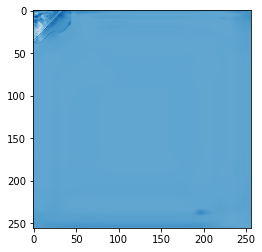

torch.Size([19, 256, 256])


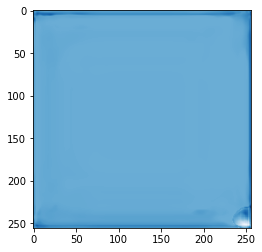

torch.Size([19, 256, 256])


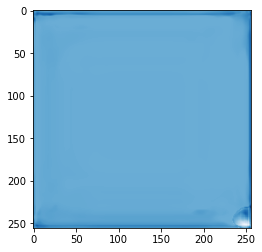

torch.Size([19, 256, 256])


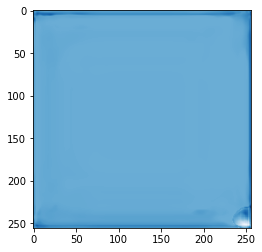

torch.Size([19, 256, 256])


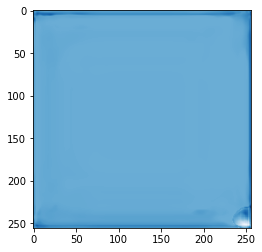

torch.Size([19, 256, 256])


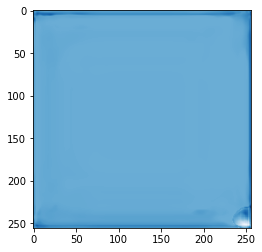

torch.Size([19, 256, 256])


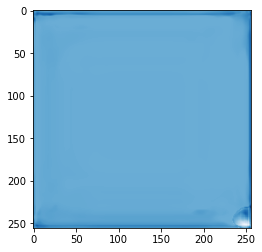

torch.Size([19, 256, 256])


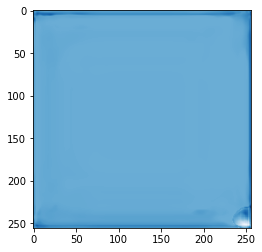

torch.Size([19, 256, 256])


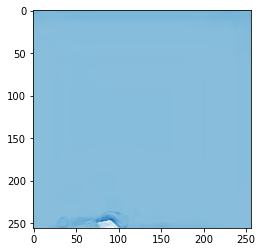

torch.Size([19, 256, 256])


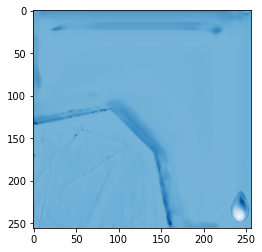

torch.Size([19, 256, 256])


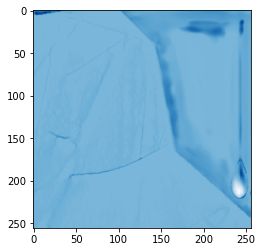

torch.Size([19, 256, 256])


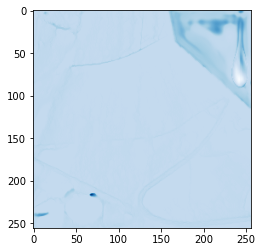

torch.Size([19, 256, 256])


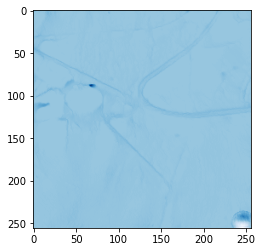

torch.Size([19, 256, 256])


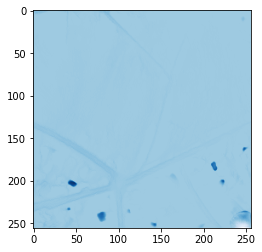

torch.Size([19, 256, 256])


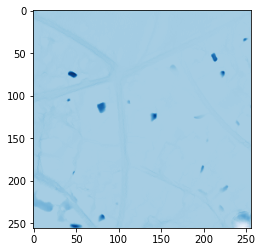

torch.Size([19, 256, 256])


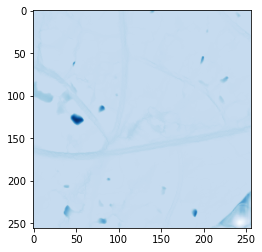

torch.Size([19, 256, 256])


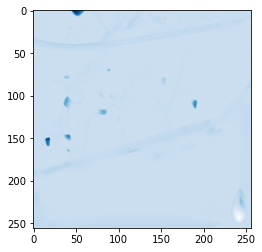

torch.Size([19, 256, 256])


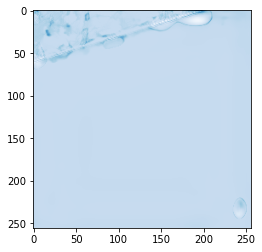

torch.Size([19, 256, 256])


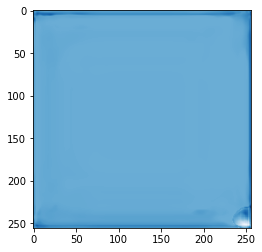

torch.Size([19, 256, 256])


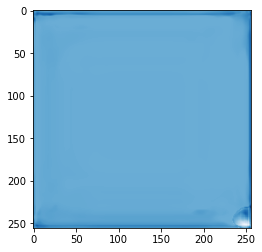

torch.Size([19, 256, 256])


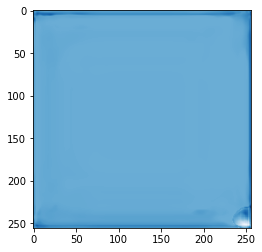

torch.Size([19, 256, 256])


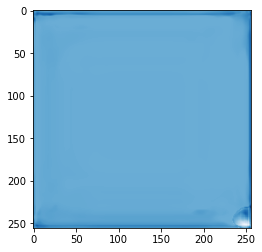

torch.Size([19, 256, 256])


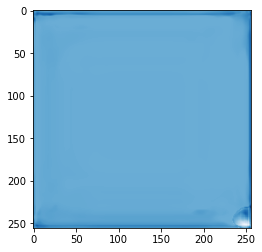

torch.Size([19, 256, 256])


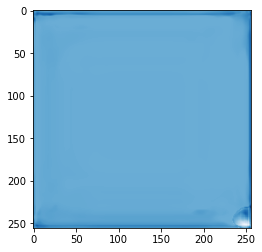

torch.Size([19, 256, 256])


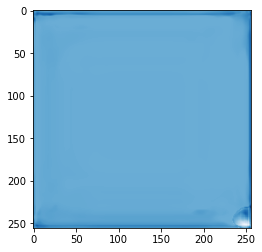

torch.Size([19, 256, 256])


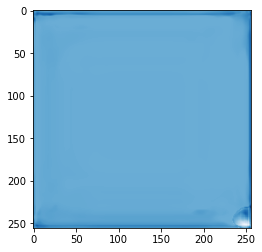

torch.Size([19, 256, 256])


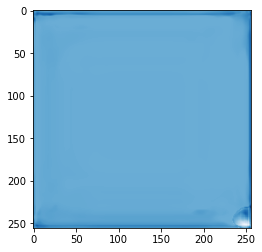

torch.Size([19, 256, 256])


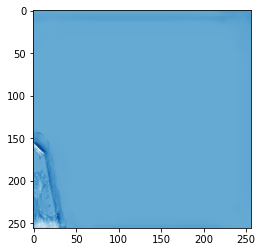

torch.Size([19, 256, 256])


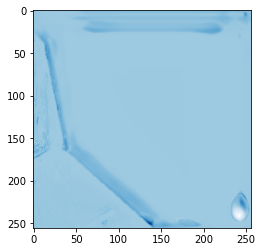

torch.Size([19, 256, 256])


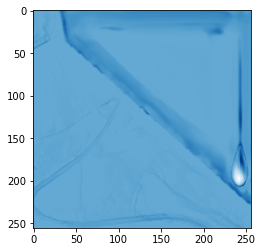

torch.Size([19, 256, 256])


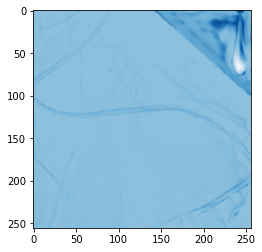

torch.Size([19, 256, 256])


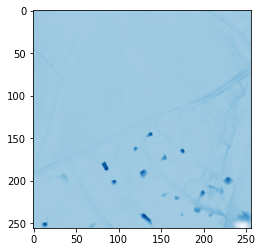

torch.Size([19, 256, 256])


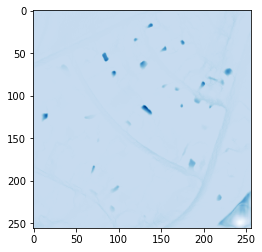

torch.Size([19, 256, 256])


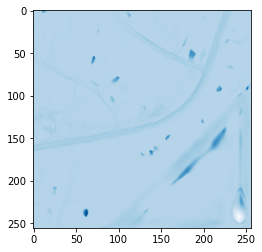

torch.Size([19, 256, 256])


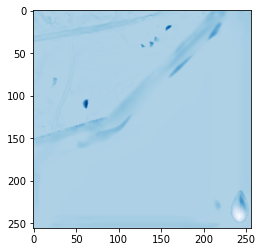

torch.Size([19, 256, 256])


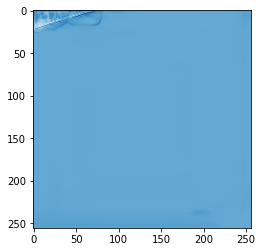

torch.Size([19, 256, 256])


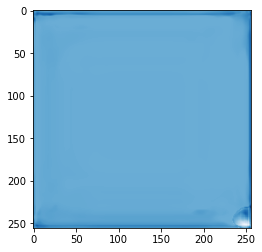

torch.Size([19, 256, 256])


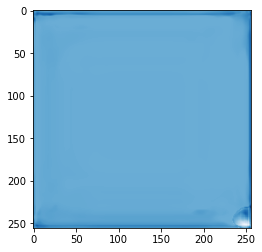

torch.Size([19, 256, 256])


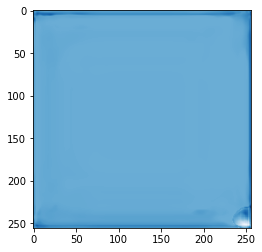

torch.Size([19, 256, 256])


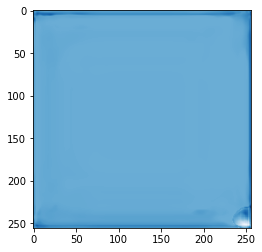

torch.Size([19, 256, 256])


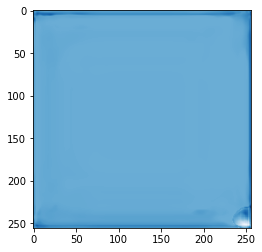

torch.Size([19, 256, 256])


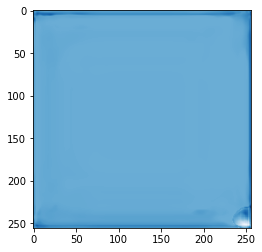

torch.Size([19, 256, 256])


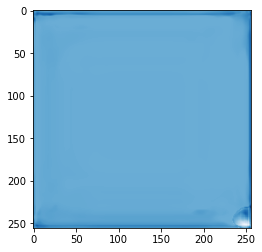

In [10]:
from evaluation_max import predict_event 
event_num = 1
# timestep = 12
pred_cnn, gt_cnn, mask_cnn = predict_event(model, dataset, event_num, 'unet', start_ts=0, ar = False, T = None)

# View reconstruction

In [ ]:
pred_cnn, gt_cnn, mask_cnn 

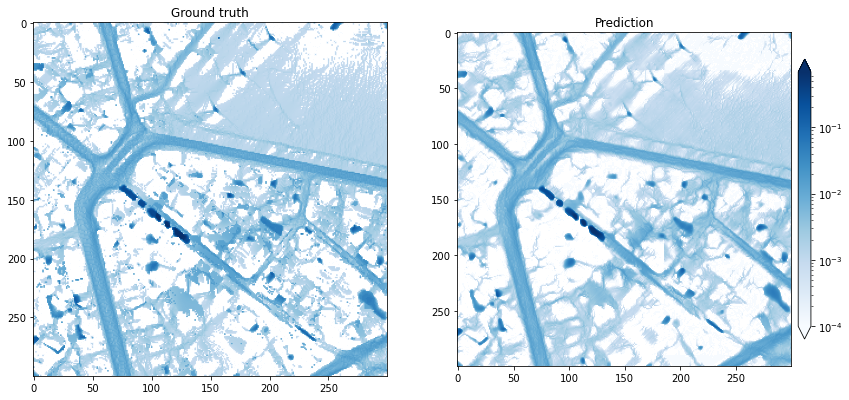

In [14]:
recons_mask_full = dataset.dem_mask
import matplotlib
ev = 0
for ev in range(1):
    
    pred =  pred_cnn*mask_cnn#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
    pred = pred[1000:1300, 2000:2300]
    gt = gt_cnn[1000:1300, 2000:2300]#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
    
#     pred =  recons_pred_full*recons_mask_full#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
#     pred = pred.cpu().detach().numpy()
#     pred = pred [1000:1300, 2000:2300]
#     gt = recons_gt_full.cpu().detach().numpy()#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
#     gt = gt[1000:1300, 2000:2300]

    max_v = np.max(pred)
    min_v = np.min(pred)

    if np.max(gt) > max_v:
        max_v = np.max(gt)
    
    l = []
    l.append(gt)
    l.append(pred)

    title = []
    title.append('Ground truth')
    title.append('Prediction')

    i = 0
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,16))
    for ax in axes.flat:
        ax.grid(False)
        ax.title.set_text(title[i])
        im = ax.imshow(l[i], cmap='Blues', norm=matplotlib.colors.LogNorm(vmin=0.0001, vmax=max_v))
        i = i + 1

    fig.subplots_adjust(right=0.8)
    fig.colorbar(im, ax=ax, extend='both', fraction=0.036, pad=0.02)

#     figtitle = "unet, 500 epochs, event=" + str(event_num)
#     plt.suptitle(figtitle, y=0.86)

    filename = folder_loc + str(h51) + 'catch_pred_gt_' + str(event_num)+ '.png'
#     plt.savefig(filename, dpi=1200)

    plt.show()

In [15]:
print(np.max(pred_cnn))
print(np.min(pred_cnn))

0.6314891
-0.16778018


In [16]:
print(np.max(gt_cnn))
print(np.min(gt_cnn))

0.99852186
0.0


In [19]:
mask_catc = mask_cnn.astype(bool)

10.65

(4409350,)
(4409350,)


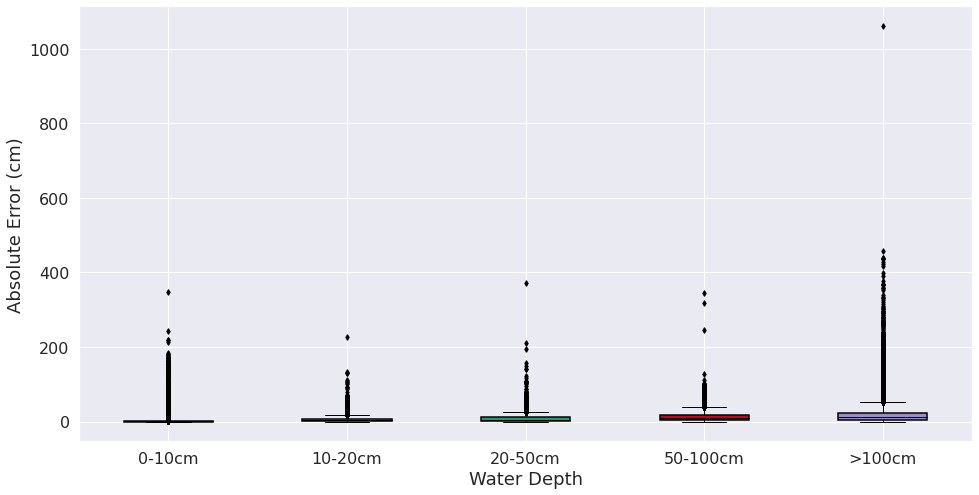

In [25]:
pred_vec = pred_cnn[mask_catc].flatten()
gt_vec = gt_cnn[mask_catc].flatten()

import seaborn as sns
import pandas as pd
from conf import max_depth_const_dict
max_depth = max_depth_const_dict['709_max']

sns.set_theme(style="darkgrid")

print(pred_vec.shape)
print(gt_vec.shape)
a = [max_depth*pred_vec, max_depth*gt_vec]

a = np.array(a).T
a_df = pd.DataFrame(data=a, columns=['pred_vec', 'gt_vec'])
a_df_sorted = a_df.sort_values(by=['gt_vec'])
a_df_sorted.reset_index(drop=True, inplace=True)
a_df_error = 100 * np.abs(a_df_sorted.pred_vec - a_df_sorted.gt_vec)    # predicting in meter, so need to be multiplied by 100

data = np.array([a_df_error[a_df_sorted.gt_vec<0.1],
        a_df_error[(a_df_sorted.gt_vec>0.10) & (a_df_sorted.gt_vec<0.20)],
        a_df_error[(a_df_sorted.gt_vec>0.20) & (a_df_sorted.gt_vec<0.50)],
        a_df_error[(a_df_sorted.gt_vec>0.50) & (a_df_sorted.gt_vec<1)],
        a_df_error[a_df_sorted.gt_vec>1]], dtype="object")
fig, ax = plt.subplots(figsize = [16,8])
ax.set_ylabel('Absolute Error (cm)', fontsize=18)
ax.set_xlabel('Water Depth', fontsize=18)
flierprops = dict(marker='d', markerfacecolor='black', markersize=4, linestyle='none', markeredgecolor='black')
bp = ax.boxplot(data, showfliers=True, patch_artist=True, flierprops=flierprops)                                #'Hide Outlier Points'
ax.set_xticklabels(['0-10cm', '10-20cm', '20-50cm', '50-100cm','>100cm'])

fill_color = ['#ef8a62', '#67a9cf', '#1b9e77', '#ca0020', '#998ec3']
o = 0
for box in bp['boxes']:
    # change outline color
    box.set(color='black', linewidth=1.5)
    # change fill color
    box.set(facecolor = fill_color[o])
    o = o+1
    
for box in bp['medians']:
    # change the median color to black
    box.set(color='black')
    
ax.tick_params(axis='both', labelsize=16)
filename = folder_loc + str(h51) + 'box_plot_out_' + str(event_num) +'.png'
# plt.savefig(filename, dpi=400)1
plt.show()

In [ ]:
from evaluation import plot_answer_sample

zoom = [500,600,500,600]
#save_folder = "/scratch2/ml_flood/data/checkpoints/709/cluster/utae_L1/experiment_0/results/c_recons/"
plot_answer_sample(pred_cnn, gt_cnn, mask_cnn, ts=1, zoom=None, show_diff=False, global_scale=True, save_folder = None, model_name = 'cnn')

In [ ]:
zoom = [1500,2000,0,500]
plot_answer_sample(pred_cnn, gt_cnn, mask_cnn, ts=1, zoom=zoom, show_diff=False, global_scale=True, save_folder = None, model_name = 'cnn')

----

### Prediction with overlapping

In [10]:
mx = dataset.px - dataset.nx + 1 
my = dataset.py - dataset.ny + 1

indx =  np.arange(0, mx, int(dataset.nx/2))
indy =  np.arange(0, my, int(dataset.ny/2))
    
x, y = np.meshgrid(indx,indy)

patch_x = mx//dataset.nx + 1
patch_y = my//dataset.ny +1 

print(mx, my, dataset.nx)
print('Number of overlapping patches in each direction :', 2 * patch_x, 2 *patch_y)   #9,11


2270 2745 256
Number of overlapping patches in each direction : 18 22


In [11]:
dataset.inds

array([[   0,    0],
       [ 128,    0],
       [ 256,    0],
       [ 384,    0],
       [ 512,    0],
       [ 640,    0],
       [ 768,    0],
       [ 896,    0],
       [1024,    0],
       [1152,    0],
       [1280,    0],
       [1408,    0],
       [1536,    0],
       [1664,    0],
       [1792,    0],
       [1920,    0],
       [2048,    0],
       [2176,    0],
       [   0,  128],
       [ 128,  128],
       [ 256,  128],
       [ 384,  128],
       [ 512,  128],
       [ 640,  128],
       [ 768,  128],
       [ 896,  128],
       [1024,  128],
       [1152,  128],
       [1280,  128],
       [1408,  128],
       [1536,  128],
       [1664,  128],
       [1792,  128],
       [1920,  128],
       [2048,  128],
       [2176,  128],
       [   0,  256],
       [ 128,  256],
       [ 256,  256],
       [ 384,  256],
       [ 512,  256],
       [ 640,  256],
       [ 768,  256],
       [ 896,  256],
       [1024,  256],
       [1152,  256],
       [1280,  256],
       [1408,

In [12]:
from utils import to_device_eval
    
event_num = 1
target = dataset.peak[event_num]

def create_inputs(dataset, x_p, y_p, xin, rainfall, mask, dem, diff_dem, xout):
        xin, mask, dem, diff_dem, xout = dataset.crop_to_patch(x_p, y_p, xin, mask, dem, diff_dem, xout)
        inputs = dataset.build_inputs(xin, rainfall, mask, dem, diff_dem)
        return inputs, xout
    
def crop_overlapping_patches(y_pred, patch_dim):
    
    cropped = y_pred[10: 
                     int(patch_dim/2) + 10, 
                     10: 
                     int(patch_dim/2) + 10]
    return cropped
    

patch_dim = dataset.nx
inds = dataset.get_all_fix_indexes(non_full=False) 
b = dataset.border_size
xin = dataset.start_ts.clone()
rainfall = dataset.rainfall_events[event_num].clone()
dem = dataset.dem
diff_dem = dataset.diff_dem
mask = dataset.dem_mask
recons_pred_full = torch.zeros(dataset.px - 2*b, dataset.py - 2*b)
recons_gt_full = torch.zeros(dataset.px - 2*b, dataset.py - 2*b)

for inds_count, (x_p, y_p) in enumerate(inds):
    inputs_ts, xout = create_inputs(dataset, x_p, y_p, xin, rainfall, mask, dem, diff_dem, target)
    (data, mask1) = inputs_ts
    data = data.unsqueeze(dim=0)
    data = to_device_eval(data)
    y_pred = model(data)['y_pred'].squeeze().detach().cpu()
    
    data_in = data.squeeze().detach().cpu()
    y_true = xout.squeeze().detach().cpu()   

#     recons_pred_full[x_p + 10:
#                      10 + (int(patch_dim/2))*(inds_count+1),
#                      y_p + 10:
#                      10 + (int(patch_dim/2))*(inds_count+1)] = crop_overlapping_patches(y_pred, patch_dim)
#     recons_gt_full[x_p + 10:
#                      10 + (int(patch_dim/2))*(inds_count+1),
#                      y_p + 10:
#                      10 + (int(patch_dim/2))*(inds_count+1)] = crop_overlapping_patches(y_true, patch_dim)
    
    recons_pred_full[x_p + 10:
                     x_p + 10 + (int(patch_dim/2)),
                     y_p + 10:
                     y_p + 10 + (int(patch_dim/2))] = crop_overlapping_patches(y_pred, patch_dim)
    recons_gt_full[x_p + 10:
                    x_p + 10 + (int(patch_dim/2)),
                    y_p + 10:
                    y_p + 10 + (int(patch_dim/2))] = crop_overlapping_patches(y_true, patch_dim)
#     recons_pred_full[x_p:x_p+patch_dim, y_p:y_p + patch_dim] = y_pred
#     recons_gt_full[x_p:x_p+patch_dim, y_p:y_p + patch_dim] = y_true
#     break



0
[0 0]


/scratch2/anaconda3/envs/MLflood/lib/python3.9/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /opt/conda/conda-bld/pytorch_1623448255797/work/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


1
[128   0]
2
[256   0]
3
[384   0]
4
[512   0]
5
[640   0]
6
[768   0]
7
[896   0]
8
[1024    0]
9
[1152    0]
10
[1280    0]
11
[1408    0]
12
[1536    0]
13
[1664    0]
14
[1792    0]
15
[1920    0]
16
[2048    0]
17
[2176    0]
18
[  0 128]
19
[128 128]
20
[256 128]
21
[384 128]
22
[512 128]
23
[640 128]
24
[768 128]
25
[896 128]
26
[1024  128]
27
[1152  128]
28
[1280  128]
29
[1408  128]
30
[1536  128]
31
[1664  128]
32
[1792  128]
33
[1920  128]
34
[2048  128]
35
[2176  128]
36
[  0 256]
37
[128 256]
38
[256 256]
39
[384 256]
40
[512 256]
41
[640 256]
42
[768 256]
43
[896 256]
44
[1024  256]
45
[1152  256]
46
[1280  256]
47
[1408  256]
48
[1536  256]
49
[1664  256]
50
[1792  256]
51
[1920  256]
52
[2048  256]
53
[2176  256]
54
[  0 384]
55
[128 384]
56
[256 384]
57
[384 384]
58
[512 384]
59
[640 384]
60
[768 384]
61
[896 384]
62
[1024  384]
63
[1152  384]
64
[1280  384]
65
[1408  384]
66
[1536  384]
67
[1664  384]
68
[1792  384]
69
[1920  384]
70
[2048  384]
71
[2176  384]
72
[  

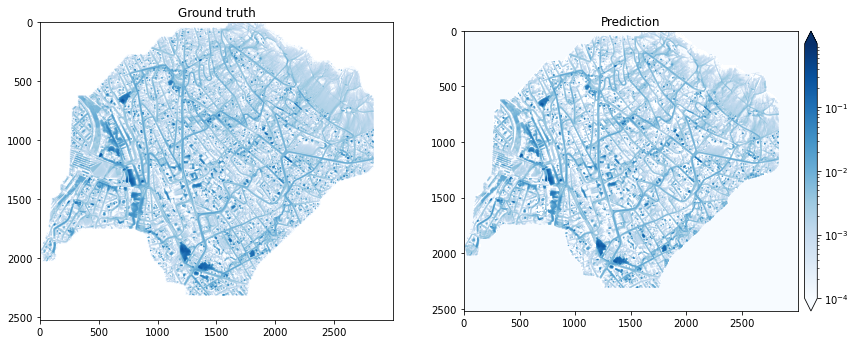

In [13]:
recons_mask_full = dataset.dem_mask
import matplotlib
ev = 0
for ev in range(1):
    
    pred =  recons_pred_full*recons_mask_full#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
    pred = pred.cpu().detach().numpy()
#     pred = pred [1000:1300, 2000:2300]
    gt = recons_gt_full.cpu().detach().numpy()#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
#     gt = gt[1000:1300, 2000:2300]

    max_v = np.max(pred)
    min_v = np.min(pred)

    if np.max(gt) > max_v:
        max_v = np.max(gt)
    
    l = []
    l.append(gt)
    l.append(pred)

    title = []
    title.append('Ground truth')
    title.append('Prediction')

    i = 0
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,16))
    for ax in axes.flat:
        ax.grid(False)
        ax.title.set_text(title[i])
        im = ax.imshow(l[i], cmap='Blues', norm=matplotlib.colors.LogNorm(vmin=0.0001, vmax=max_v))
        i = i + 1

    fig.subplots_adjust(right=0.8)
    fig.colorbar(im, ax=ax, extend='both', fraction=0.036, pad=0.02)

#     figtitle = "unet, 500 epochs, event=" + str(event_num)
#     plt.suptitle(figtitle, y=0.86)

    filename = folder_loc + str(h51) + 'catch_pred_gt_' + str(event_num)+ '.png'
#     plt.savefig(filename, dpi=1200)

    plt.show()

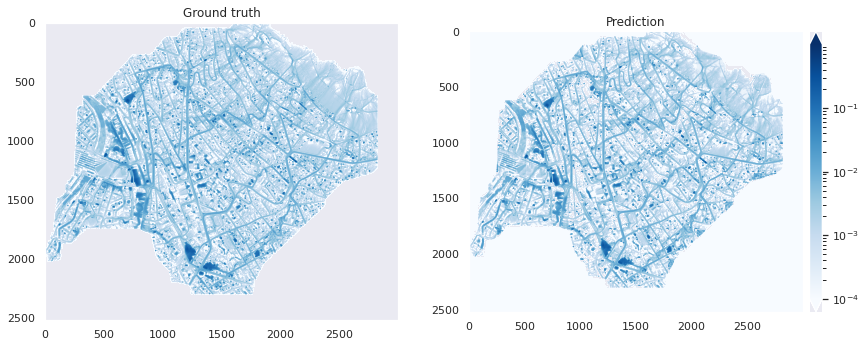

In [53]:
recons_mask_full = dataset.dem_mask
import matplotlib
ev = 0
for ev in range(1):
    
    pred =  recons_pred_full*recons_mask_full#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
    pred = pred.cpu().detach().numpy()
#     pred = pred [1000:1300, 2000:2300]
    gt = recons_gt_full.cpu().detach().numpy()#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
#     gt = gt[1000:1300, 2000:2300]

    max_v = np.max(pred)
    min_v = np.min(pred)

    if np.max(gt) > max_v:
        max_v = np.max(gt)
    
    l = []
    l.append(gt)
    l.append(pred)

    title = []
    title.append('Ground truth')
    title.append('Prediction')

    i = 0
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,16))
    for ax in axes.flat:
        ax.grid(False)
        ax.title.set_text(title[i])
        im = ax.imshow(l[i], cmap='Blues', norm=matplotlib.colors.LogNorm(vmin=0.0001, vmax=max_v))
        i = i + 1

    fig.subplots_adjust(right=0.8)
    fig.colorbar(im, ax=ax, extend='both', fraction=0.036, pad=0.02)

#     figtitle = "unet, 500 epochs, event=" + str(event_num)
#     plt.suptitle(figtitle, y=0.86)

    filename = folder_loc + str(h51) + 'catch_pred_gt_' + str(event_num)+ '.png'
#     plt.savefig(filename, dpi=1200)

    plt.show()

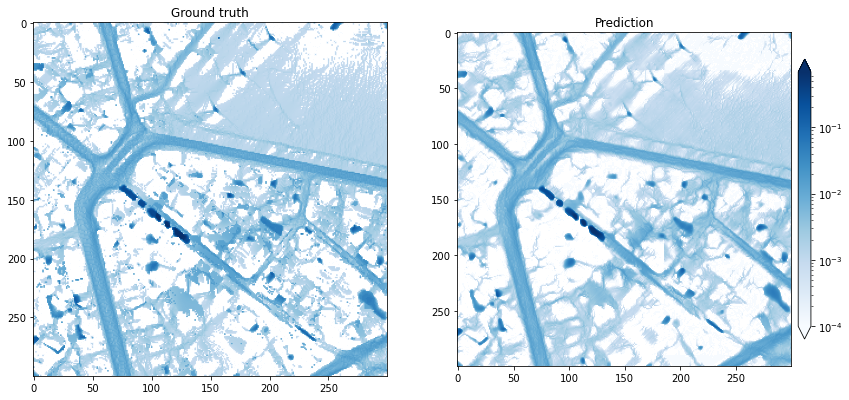

In [17]:
recons_mask_full = dataset.dem_mask
import matplotlib
ev = 0
for ev in range(1):
    
    pred =  recons_pred_full*recons_mask_full#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
    pred = pred.cpu().detach().numpy()
    
    
#     pred = pred [1000:1300, 2000:2300]
    pred = pred [1000:1300, 2000:2300]#[800:1500, 1800:2500]
    gt = recons_gt_full.cpu().detach().numpy()#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
    gt = gt [1000:1300, 2000:2300] #[800:1500, 1800:2500] #[1000:1300, 2000:2300]

    max_v = np.max(pred)
    min_v = np.min(pred)

    if np.max(gt) > max_v:
        max_v = np.max(gt)
    
    l = []
    l.append(gt)
    l.append(pred)

    title = []
    title.append('Ground truth')
    title.append('Prediction')

    i = 0
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,16))
    for ax in axes.flat:
        ax.grid(False)
        ax.title.set_text(title[i])
        im = ax.imshow(l[i], cmap='Blues', norm=matplotlib.colors.LogNorm(vmin=0.0001, vmax=max_v))
        i = i + 1

    fig.subplots_adjust(right=0.8)
    fig.colorbar(im, ax=ax, extend='both', fraction=0.036, pad=0.02)

#     figtitle = "unet, 500 epochs, event=" + str(event_num)
#     plt.suptitle(figtitle, y=0.86)

    filename = folder_loc + str(h51) + 'catch_pred_gt_' + str(event_num)+ '.png'
#     plt.savefig(filename, dpi=1200)

    plt.show()

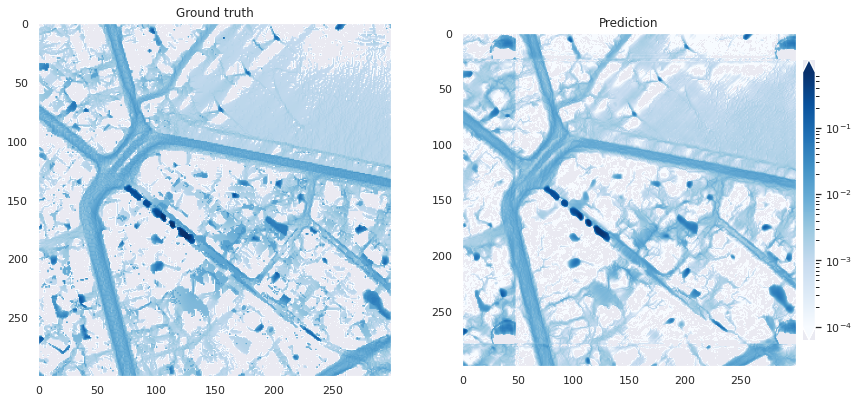

In [54]:
recons_mask_full = dataset.dem_mask
import matplotlib
ev = 0
for ev in range(1):
    
    pred =  recons_pred_full*recons_mask_full#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
    pred = pred.cpu().detach().numpy()
    pred = pred [1000:1300, 2000:2300]
    gt = recons_gt_full.cpu().detach().numpy()#[2000:2100, 2000:2100]#[1600:1700, 800:900]#[1800:1900, 900:1000]
    gt = gt[1000:1300, 2000:2300]

    max_v = np.max(pred)
    min_v = np.min(pred)

    if np.max(gt) > max_v:
        max_v = np.max(gt)
    
    l = []
    l.append(gt)
    l.append(pred)

    title = []
    title.append('Ground truth')
    title.append('Prediction')

    i = 0
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,16))
    for ax in axes.flat:
        ax.grid(False)
        ax.title.set_text(title[i])
        im = ax.imshow(l[i], cmap='Blues', norm=matplotlib.colors.LogNorm(vmin=0.0001, vmax=max_v))
        i = i + 1

    fig.subplots_adjust(right=0.8)
    fig.colorbar(im, ax=ax, extend='both', fraction=0.036, pad=0.02)

#     figtitle = "unet, 500 epochs, event=" + str(event_num)
#     plt.suptitle(figtitle, y=0.86)

    filename = folder_loc + str(h51) + 'catch_pred_gt_' + str(event_num)+ '.png'
#     plt.savefig(filename, dpi=1200)

    plt.show()

----